In [1]:
import sys

sys.path.append("../../python/example/berry")
import nb_config

nb_config.setup()

In [2]:
import numpy as np
import scipy.stats
from scipy.special import logit, expit
import matplotlib.pyplot as plt

import util
import quadrature
import fast_inla

import mcmc


sigma2_n = 20
n_arms = 2
mu_sig_sq = 100.0
mu_0 = -1.34
logit_p1 = logit(0.3)
n = np.full((1, 2), 35)
# y = np.array([[2, 2]])
y = np.array([[0, 1]])
n.shape, y.shape

/Users/tbent/.mambaforge/envs/imprint/lib/python3.10/site-packages/jax/_src/lib/__init__.py:33: UserWarning: JAX on Mac ARM machines is experimental and minimally tested. Please see https://github.com/google/jax/issues/5501 in the event of problems.
  warnings.warn("JAX on Mac ARM machines is experimental and minimally tested. "
/Users/tbent/.mambaforge/envs/imprint/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


((1, 2), (1, 2))

In [3]:
sigma2_n = sigma2_n
sigma2_rule = util.log_gauss_rule(sigma2_n, 1e-6, 1e3)
arms = np.arange(n_arms)
cov = np.full((sigma2_n, n_arms, n_arms), mu_sig_sq)
cov[:, arms, arms] += sigma2_rule.pts[:, None]
neg_precQ = -np.linalg.inv(cov)
logprecQdet = 0.5 * np.log(np.linalg.det(-neg_precQ))
log_prior = scipy.stats.invgamma.logpdf(sigma2_rule.pts, 0.0005, scale=0.000005)

In [4]:
def calc_log_joint(theta, sig_idx):
    theta_m0 = theta - mu_0
    theta_adj = theta + logit_p1
    exp_theta_adj = np.exp(theta_adj)
    out = 0.5 * np.einsum(
        "...i,...ij,...j", theta_m0, neg_precQ[sig_idx], theta_m0
    ) + np.sum(
        theta_adj * y - n * np.log(exp_theta_adj + 1),
        axis=-1,
    )
    out -= np.max(out)
    return out

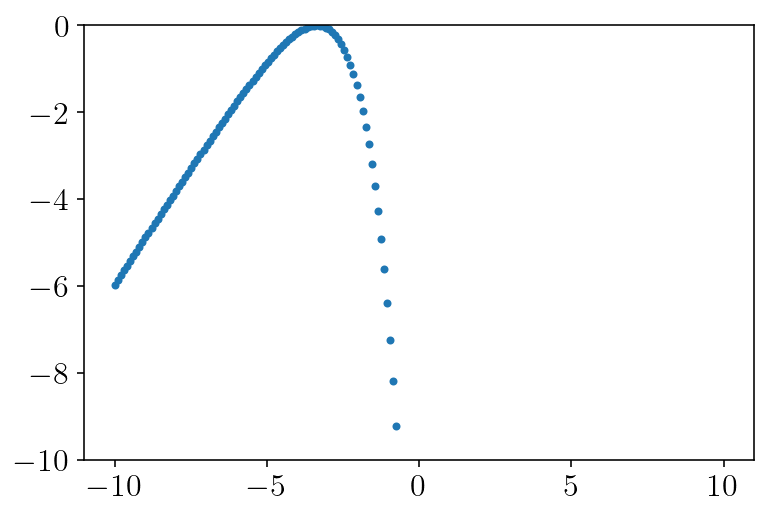

In [5]:
ts = np.linspace(-10, 10, 200)
theta2d = np.meshgrid(ts, ts, indexing="ij")
theta = np.stack([ti.ravel() for ti in theta2d], axis=-1)
theta1d = np.stack((theta2d[0][:, 0], theta2d[0][:, 0]), axis=-1)
theta1d[:, 1] = theta1d[:, 0]
theta = theta1d
sig_idx = 0
logjoint = calc_log_joint(theta, sig_idx)
logjoint -= logjoint.max()
levels = np.linspace(-10, 0, 21)
plt.plot(theta1d[:, 0], logjoint, ".")
plt.ylim([-10, 0])
plt.show()

In [6]:
fi = fast_inla.FastINLA(n_arms, sigma2_n=sigma2_n)

In [9]:
results_mcmc = mcmc.mcmc_berry(
    np.stack((y, n), axis=-1),
    fi.logit_p1,
    fi.thresh_theta,
    dtype=np.float64,
    n_samples=100000,
)

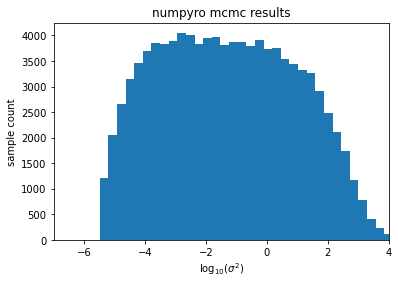

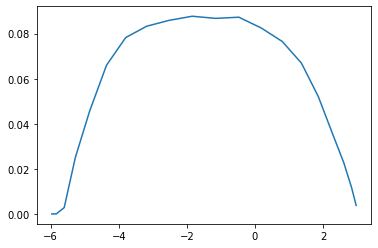

In [10]:
sigma2_mcmc = results_mcmc["x"][0]["sigma2"][0]
plt.title("numpyro mcmc results")
plt.hist(np.log10(sigma2_mcmc.to_py()), bins=40)
plt.xlabel("$\log_{10} (\sigma^2)$")
plt.ylabel("sample count")
plt.xlim([-7, 4])
plt.show()

mcmc_pdf = mcmc.calc_pdf(sigma2_mcmc, fi.sigma2_rule.pts, fi.sigma2_rule.wts)
plt.plot(np.log10(fi.sigma2_rule.pts), mcmc_pdf * fi.sigma2_rule.wts)
plt.show()

/Users/tbent/Dropbox/active/fda/imprint/research/berry/../../python/example/berry/fast_inla.py:226: RuntimeWarning: overflow encountered in exp
  exp_theta_adj = np.exp(theta_adj)
/Users/tbent/Dropbox/active/fda/imprint/research/berry/../../python/example/berry/fast_inla.py:226: RuntimeWarning: overflow encountered in exp
  exp_theta_adj = np.exp(theta_adj)
/Users/tbent/Dropbox/active/fda/imprint/research/berry/../../python/example/berry/fast_inla.py:226: RuntimeWarning: overflow encountered in exp
  exp_theta_adj = np.exp(theta_adj)
/Users/tbent/Dropbox/active/fda/imprint/research/berry/../../python/example/berry/fast_inla.py:226: RuntimeWarning: overflow encountered in exp
  exp_theta_adj = np.exp(theta_adj)


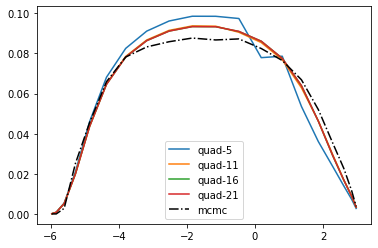

In [11]:
for n_theta in [5, 11, 16, 21]:
    integral = quadrature.integrate(
        fi, y[0], n[0], integrate_sigma2=False, n_theta=n_theta, tol=1e-7
    )
    integral_scaled = integral / np.sum(integral * fi.sigma2_rule.wts)
    plt.plot(
        np.log10(fi.sigma2_rule.pts),
        integral_scaled * fi.sigma2_rule.wts,
        label="quad-" + str(n_theta),
    )
plt.plot(
    np.log10(fi.sigma2_rule.pts), mcmc_pdf * fi.sigma2_rule.wts, "k-.", label="mcmc"
)
plt.legend()
plt.show()

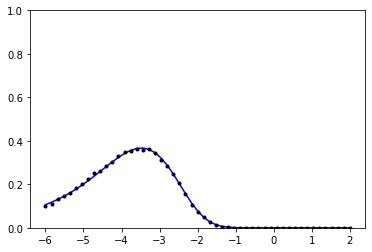

/Users/tbent/Dropbox/active/fda/imprint/research/berry/../../python/example/berry/fast_inla.py:226: RuntimeWarning: overflow encountered in exp
  exp_theta_adj = np.exp(theta_adj)


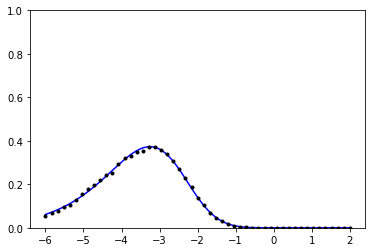

In [18]:
ti_rule = util.simpson_rule(51, -6, 2)

for arm_idx in range(2):
    mcmc_arm = results_mcmc["x"][0]["theta"][0, :, arm_idx].to_py()
    mcmc_arm_pdf = mcmc.calc_pdf(mcmc_arm, ti_rule.pts, ti_rule.wts)

    quad_p_ti_g_y = quadrature.integrate(
        fi, y[0], n[0], fixed_arm_dim=arm_idx, fixed_arm_values=ti_rule.pts, n_theta=11
    )
    quad_scaled = quad_p_ti_g_y / np.sum(quad_p_ti_g_y * ti_rule.wts, axis=0)
    plt.plot(ti_rule.pts, quad_scaled, "b-")
    plt.plot(ti_rule.pts, mcmc_arm_pdf, "k.")
    plt.ylim([0, 1.0])
    plt.show()

/Users/tbent/Dropbox/active/fda/imprint/research/berry/../../python/example/berry/fast_inla.py:226: RuntimeWarning: overflow encountered in exp
  exp_theta_adj = np.exp(theta_adj)


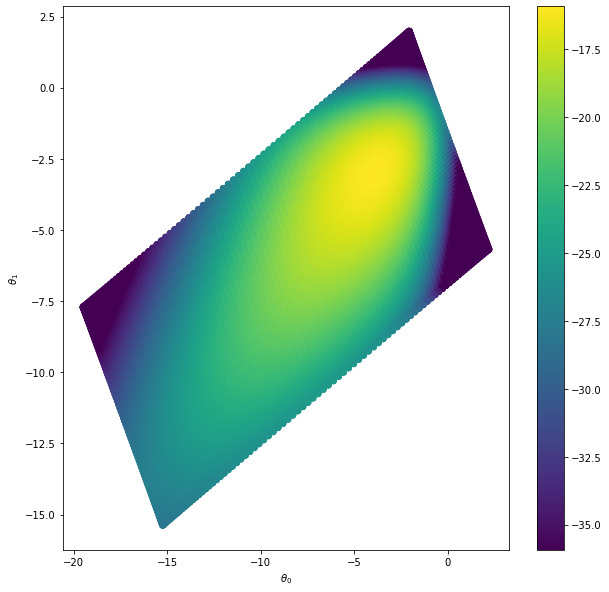

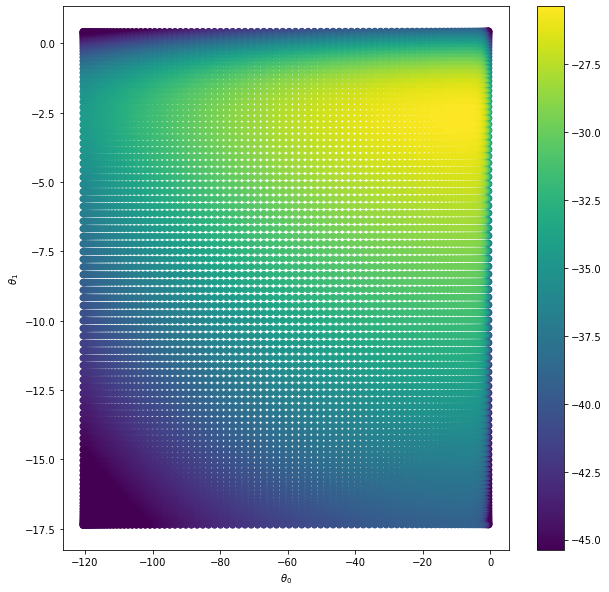

In [19]:
ti_rule = util.simpson_rule(51, -6, 2)
grids, wts, logjt = quadrature.build_grid(fi, y[0], n[0], n_theta=100, tol=1e-6)
for sig_idx in [12, 18]:  # range(0, 20, 5):
    plt.figure(figsize=(10, 10))
    f = logjt[:, :, sig_idx]
    vmax = np.max(f)
    vmin = vmax - 20
    plt.scatter(
        grids[:, :, sig_idx, 0], grids[:, :, sig_idx, 1], c=f, vmin=vmin, vmax=vmax
    )
    plt.xlabel(r"$\theta_0$")
    plt.ylabel(r"$\theta_1$")
    plt.colorbar()
    plt.show()

# 4D

In [24]:
fi4 = fast_inla.FastINLA(n_arms=4, sigma2_n=30)
n4 = np.array([20, 20, 35, 35])
y4 = np.array([0, 1, 9, 10], dtype=np.float64)

In [25]:
mcmc4 = mcmc.mcmc_berry(
    np.stack((y4[None], n4[None]), axis=-1),
    fi4.logit_p1,
    fi4.thresh_theta,
    dtype=np.float64,
    n_samples=500000,
)

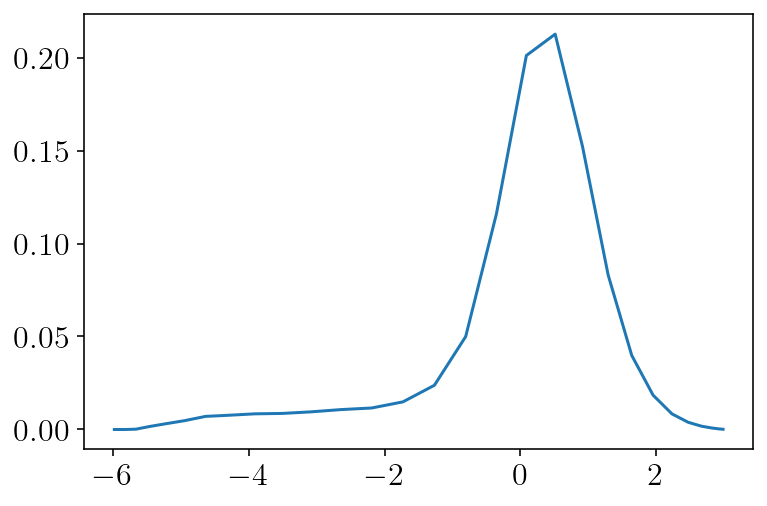

In [26]:
sigma2_mcmc4 = mcmc4["x"][0]["sigma2"][0]
mcmc4_pdf = mcmc.calc_pdf(sigma2_mcmc4, fi4.sigma2_rule.pts, fi4.sigma2_rule.wts)
plt.plot(np.log10(fi4.sigma2_rule.pts), mcmc4_pdf * fi4.sigma2_rule.wts)
plt.show()

/Users/tbent/Dropbox/active/fda/imprint/research/berry/../../python/example/berry/fast_inla.py:226: RuntimeWarning: overflow encountered in exp
  exp_theta_adj = np.exp(theta_adj)


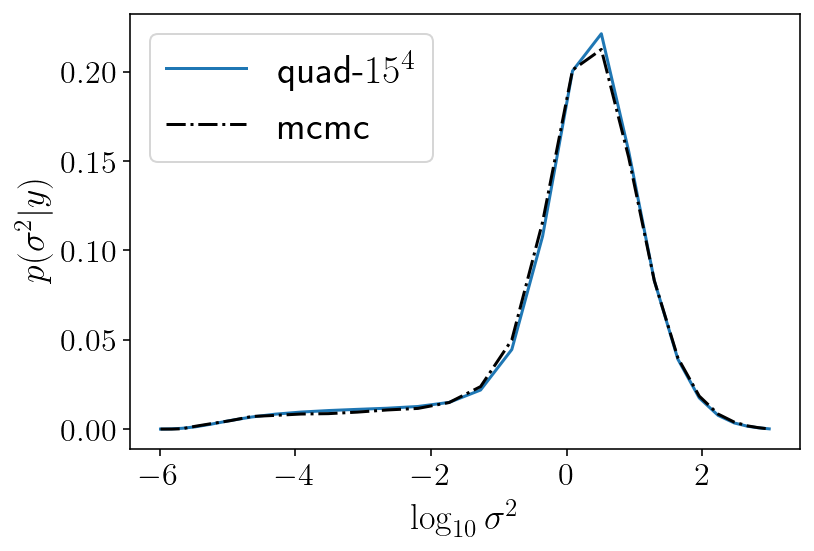

In [27]:
integral = quadrature.integrate(
    fi4, y4, n4, integrate_sigma2=False, n_theta=15, tol=1e-7
)
integral_scaled = integral / np.sum(integral * fi4.sigma2_rule.wts)
plt.plot(
    np.log10(fi4.sigma2_rule.pts),
    integral_scaled * fi4.sigma2_rule.wts,
    label="quad-$\mathrm{15^4}$",
)
plt.plot(
    np.log10(fi4.sigma2_rule.pts), mcmc4_pdf * fi4.sigma2_rule.wts, "k-.", label="mcmc"
)
plt.xlabel(r"$\log_{10} \sigma^2$")
plt.ylabel(r"$p(\sigma^2 | y)$")
plt.legend()
plt.show()

/Users/tbent/Dropbox/active/fda/imprint/research/berry/../../python/example/berry/fast_inla.py:226: RuntimeWarning: overflow encountered in exp
  exp_theta_adj = np.exp(theta_adj)
/Users/tbent/Dropbox/active/fda/imprint/research/berry/../../python/example/berry/fast_inla.py:226: RuntimeWarning: overflow encountered in exp
  exp_theta_adj = np.exp(theta_adj)
/Users/tbent/Dropbox/active/fda/imprint/research/berry/../../python/example/berry/fast_inla.py:226: RuntimeWarning: overflow encountered in exp
  exp_theta_adj = np.exp(theta_adj)


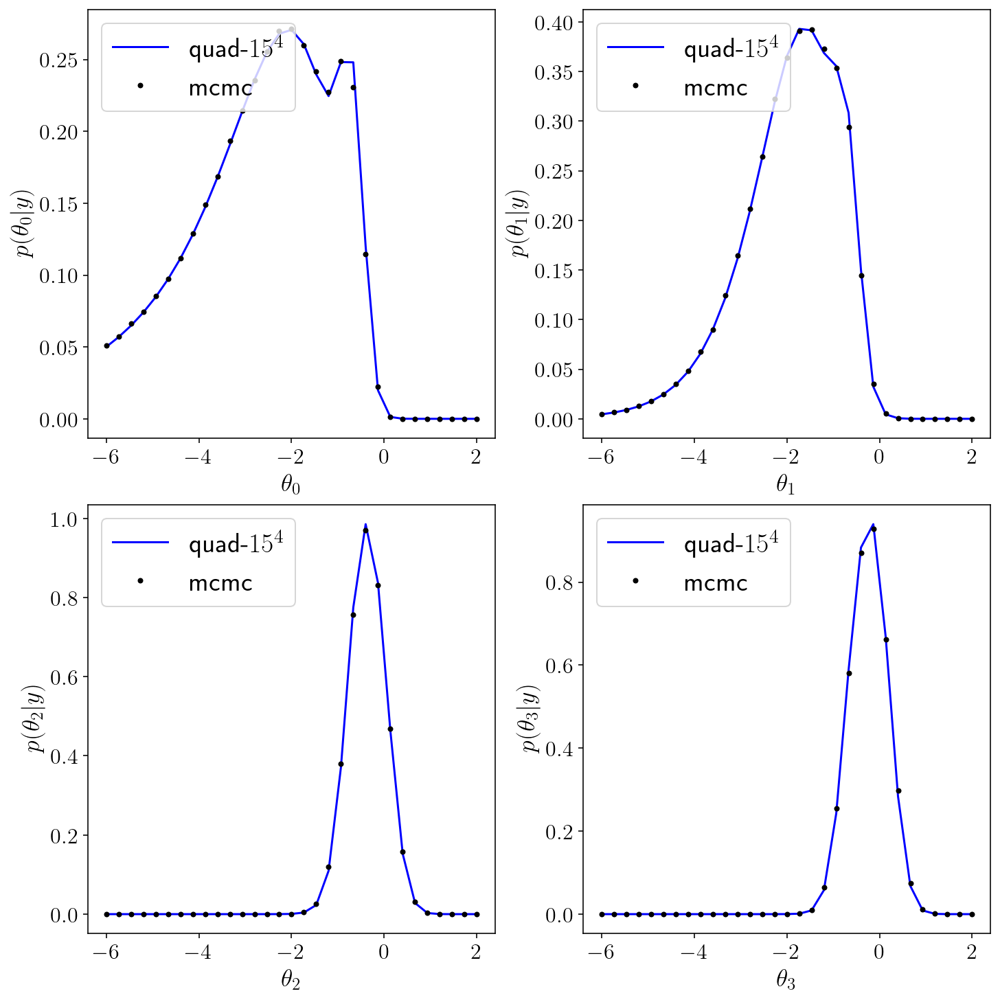

In [28]:
ti_rule = util.simpson_rule(31, -6, 2)

plt.figure(figsize=(10, 10), constrained_layout=True)
for arm_idx in range(4):
    mcmc_arm = mcmc4["x"][0]["theta"][0, :, arm_idx].to_py()
    mcmc_arm_pdf = mcmc.calc_pdf(mcmc_arm, ti_rule.pts, ti_rule.wts)

    quad_p_ti_g_y = quadrature.integrate(
        fi4, y4, n4, fixed_arm_dim=arm_idx, fixed_arm_values=ti_rule.pts, n_theta=15
    )
    quad_scaled = quad_p_ti_g_y / np.sum(quad_p_ti_g_y * ti_rule.wts, axis=0)
    plt.subplot(2, 2, arm_idx + 1)
    plt.plot(ti_rule.pts, quad_scaled, "b-", label="quad-$\mathrm{15^4}$")
    plt.plot(ti_rule.pts, mcmc_arm_pdf, "k.", label="mcmc")
    plt.xlabel(r"$\theta_" + str(arm_idx) + "$")
    plt.ylabel(r"$p(\theta_" + str(arm_idx) + " | y)$")
    plt.legend(loc="upper left")
plt.show()

0 0 -1.26837670850107


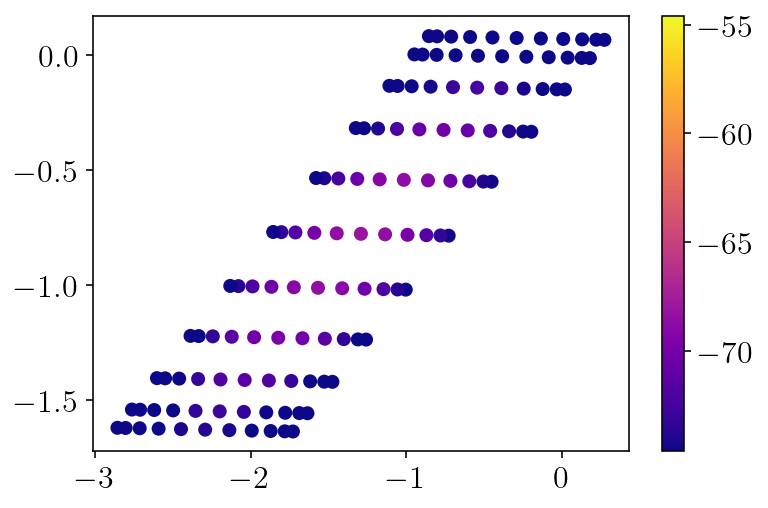

0 3 -1.26837670850107


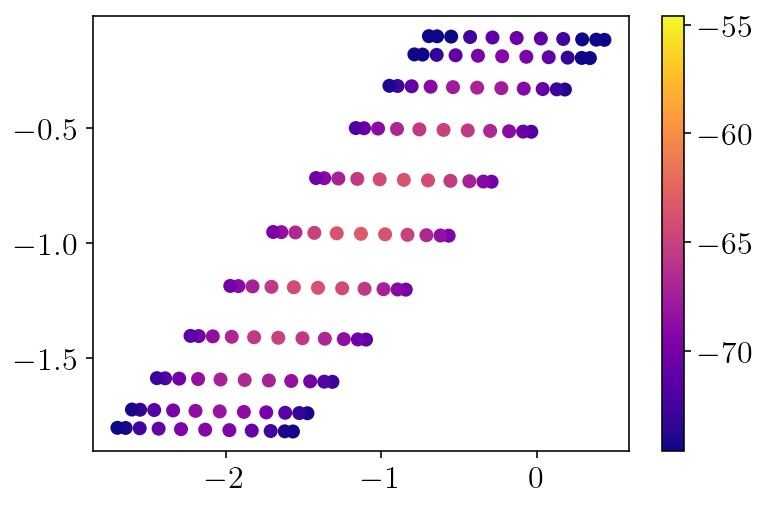

0 6 -1.26837670850107


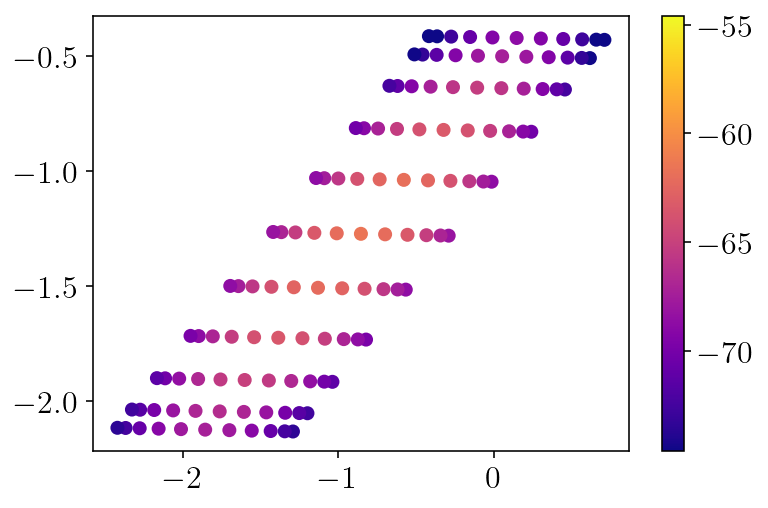

0 9 -1.26837670850107


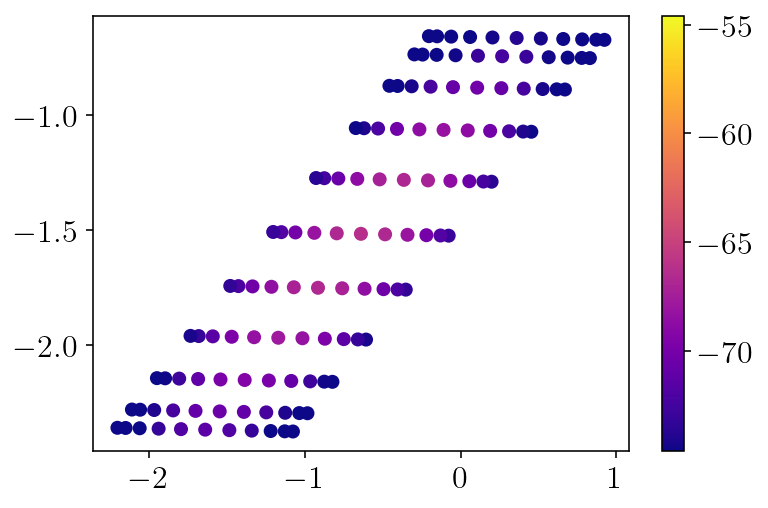

3 0 -1.26837670850107


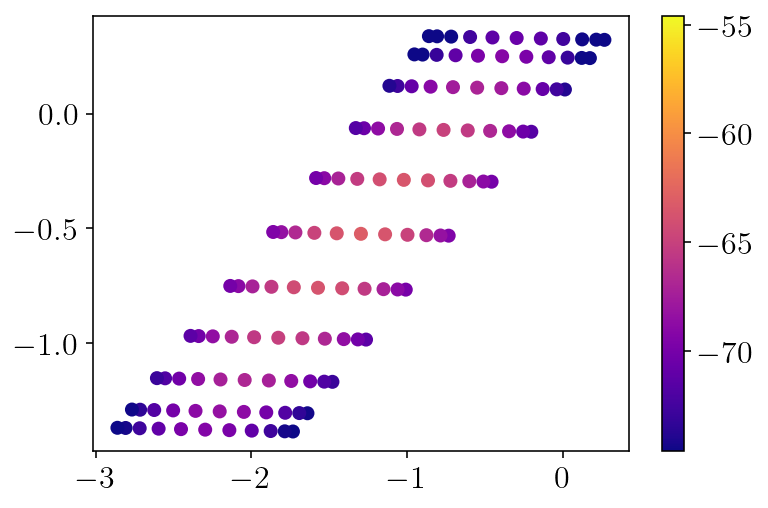

3 3 -1.26837670850107


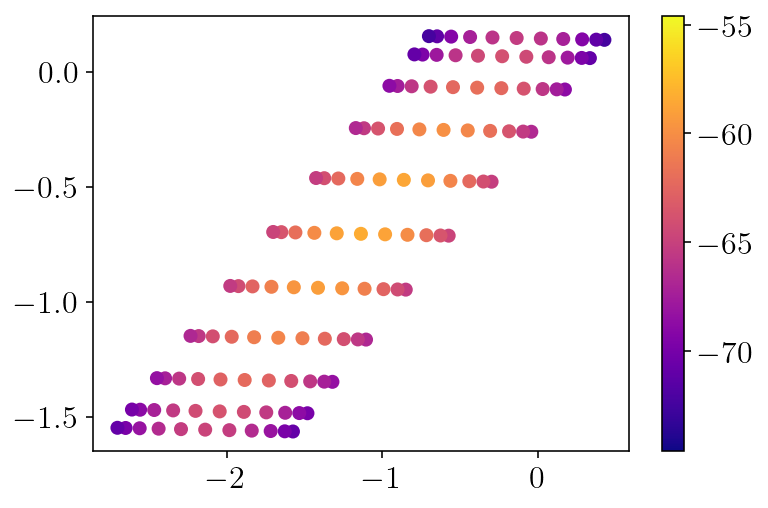

3 6 -1.26837670850107


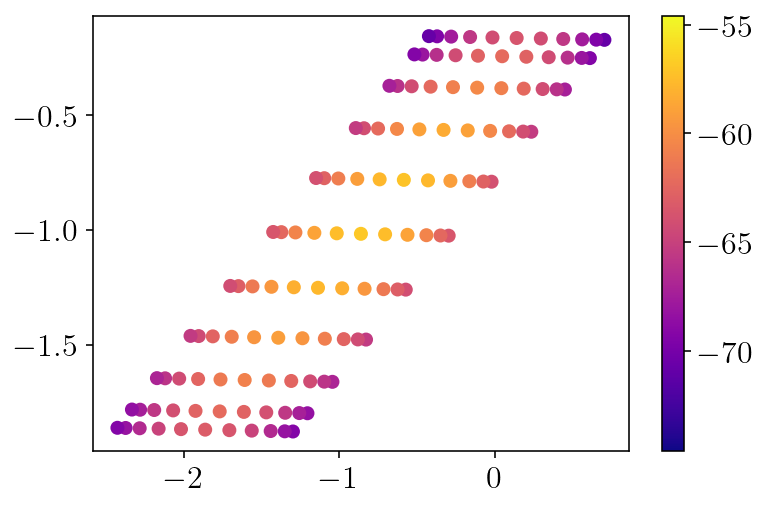

3 9 -1.26837670850107


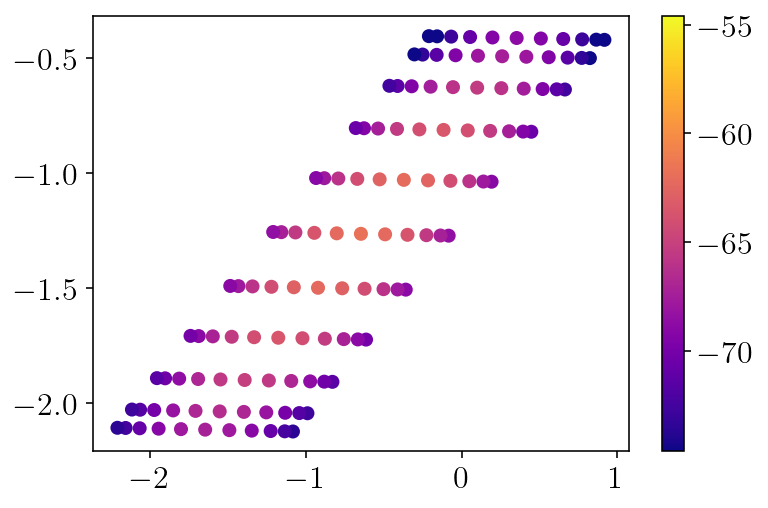

6 0 -1.26837670850107


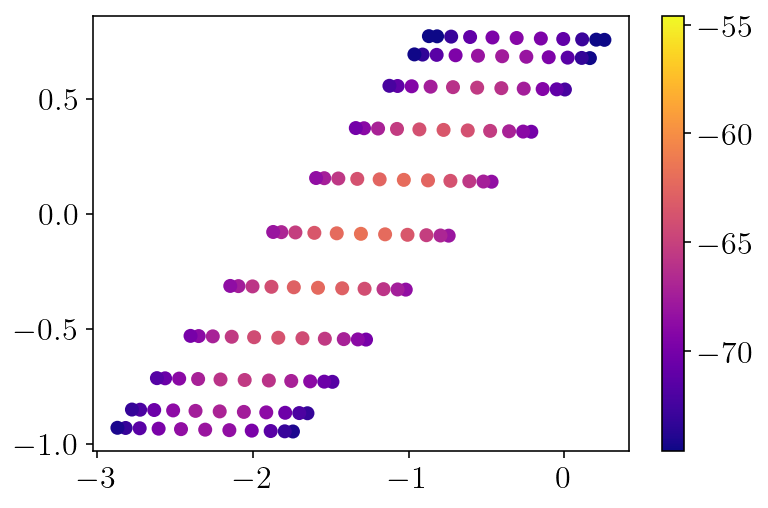

6 3 -1.26837670850107


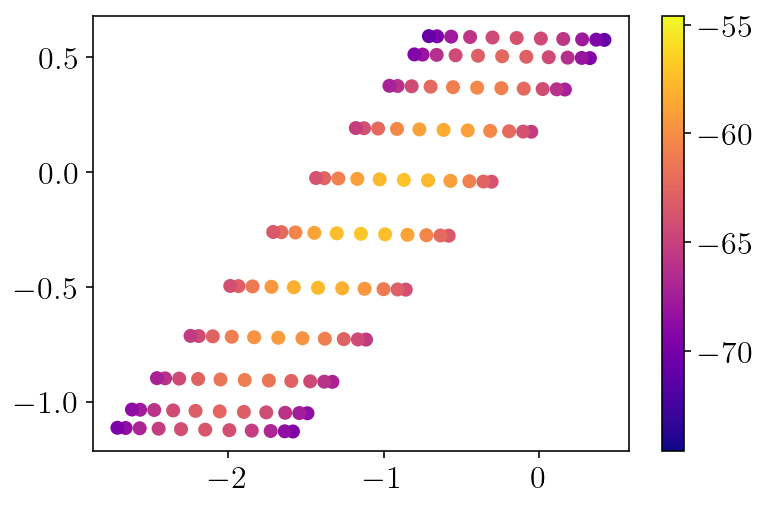

6 6 -1.26837670850107


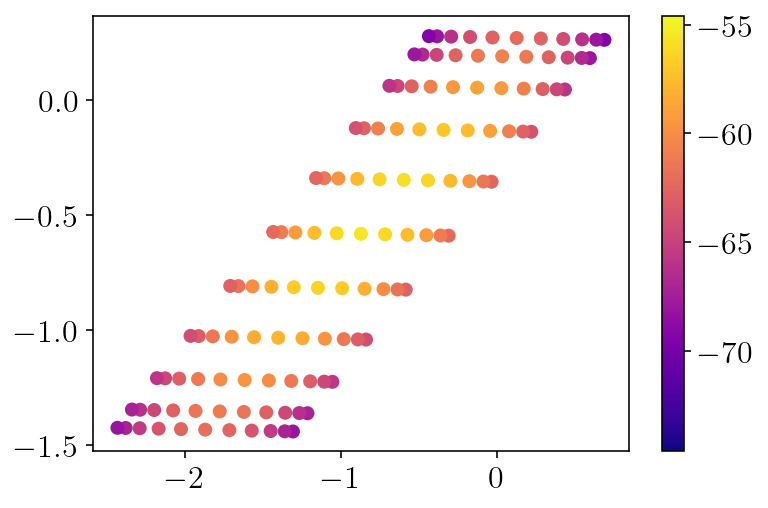

6 9 -1.26837670850107


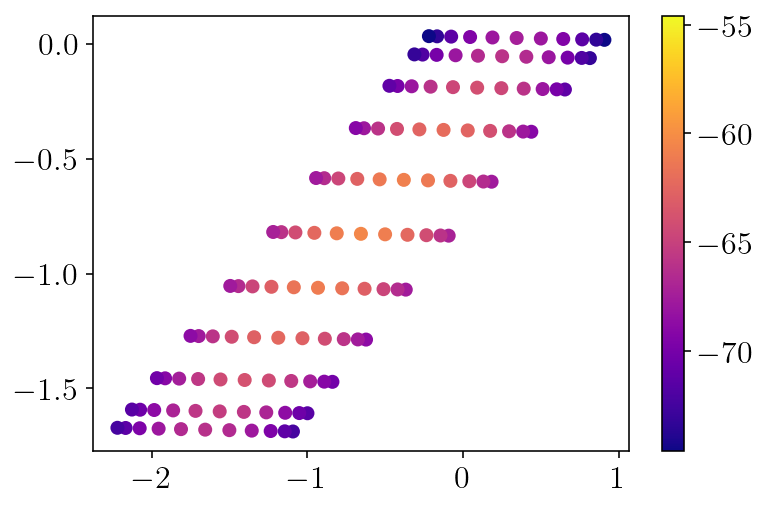

9 0 -1.26837670850107


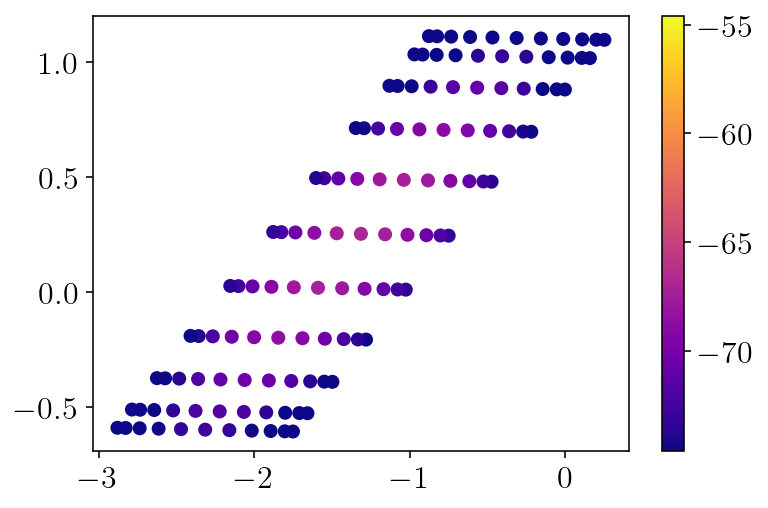

9 3 -1.26837670850107


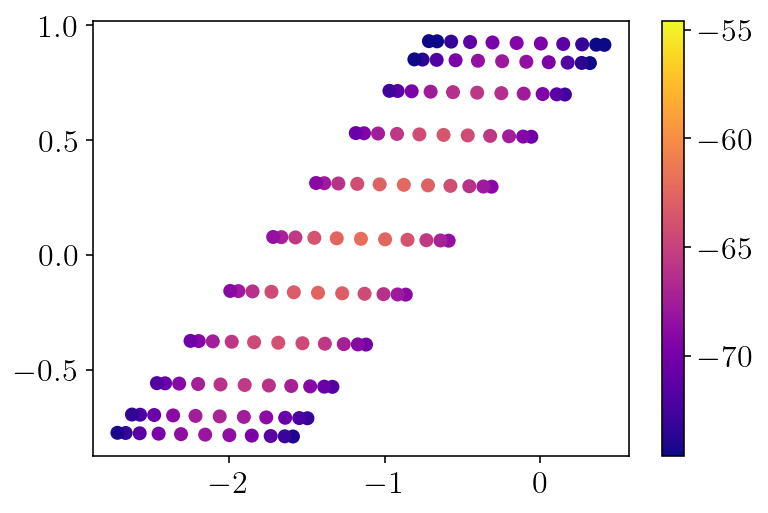

9 6 -1.26837670850107


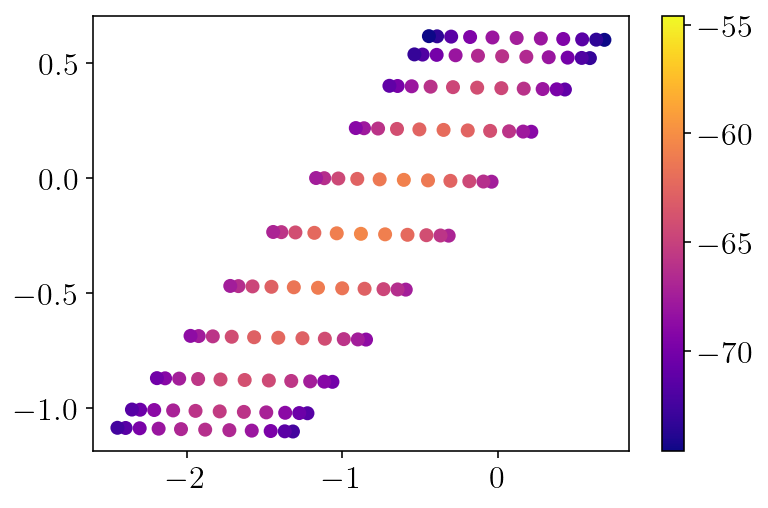

9 9 -1.26837670850107


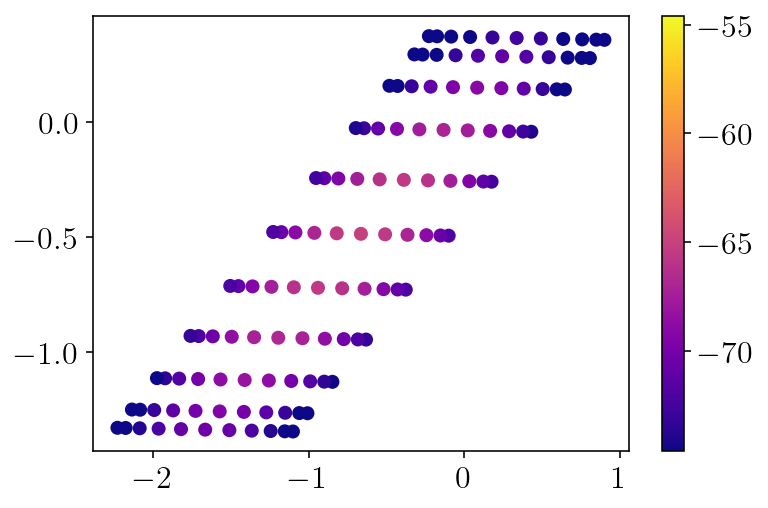

In [31]:
grids, wts, logjt = quadrature.build_grid(
    fi4, y4, n4, integrate_sigma2=False, n_theta=11, tol=1e-3
)
for si in [15]:  # range(20, 50, 5):
    for ti_slice1 in range(0, 11, 3):
        for ti_slice2 in range(0, 11, 3):
            print(ti_slice1, ti_slice2, np.log10(fi4.sigma2_rule.pts[si]))
            max_idxer = np.s_[:, :, :, :, si]
            idxer = np.s_[ti_slice1, ti_slice2, :, :, si]
            f = logjt[idxer].ravel()
            vmax = np.max(logjt[max_idxer])
            vmin = vmax - 20
            if not (np.any(f) > vmax - 10):
                print("skip")
                continue
            selection = f > vmin
            plt.scatter(
                grids[idxer][..., 0].ravel(),
                grids[idxer][..., 3].ravel(),
                c=f,
                vmin=vmin,
                vmax=vmax,
            )
            plt.colorbar()
            plt.show()

-5.233045930722457


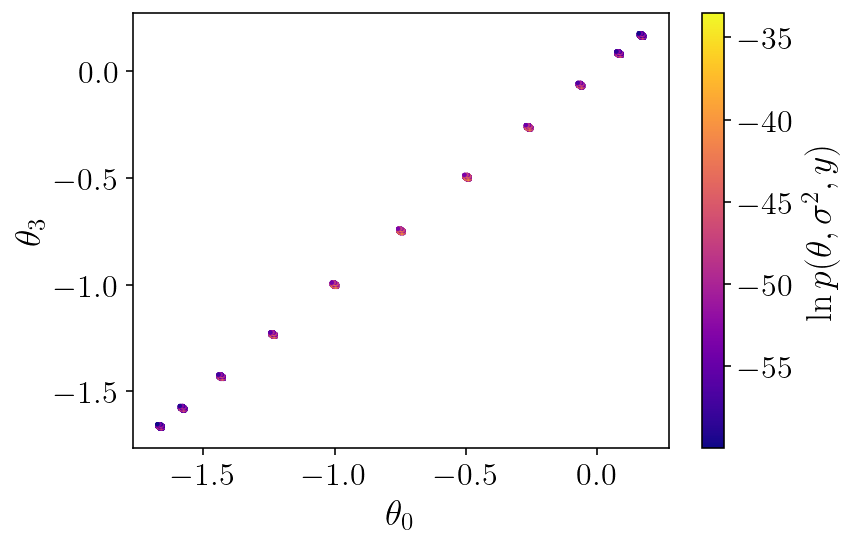

-4.954998444471718


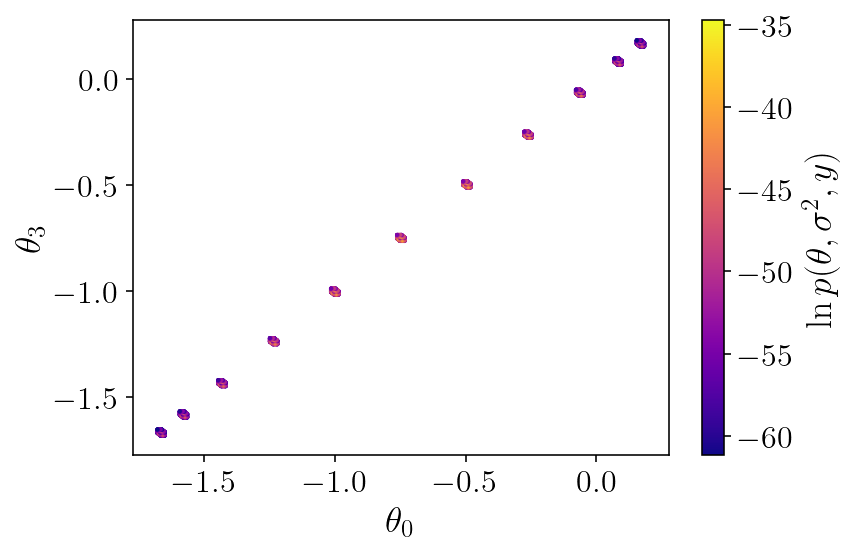

-4.640327226569921


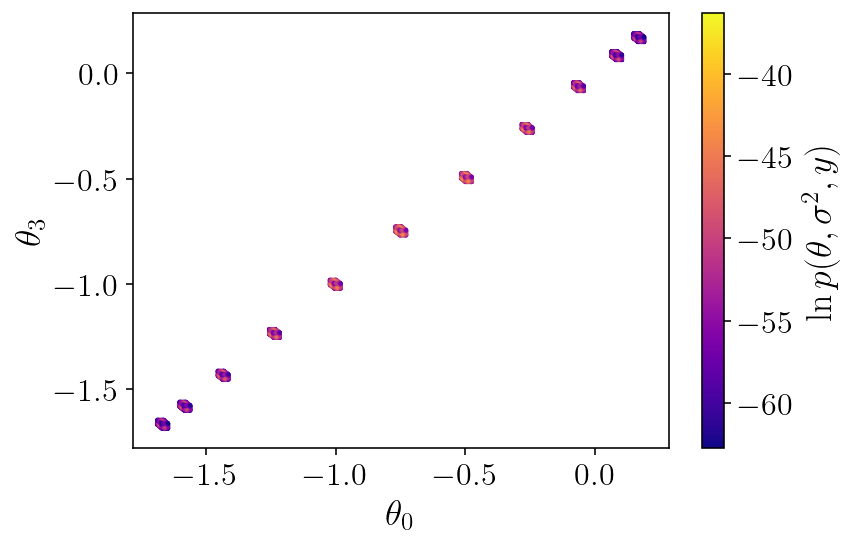

-4.292367823451594


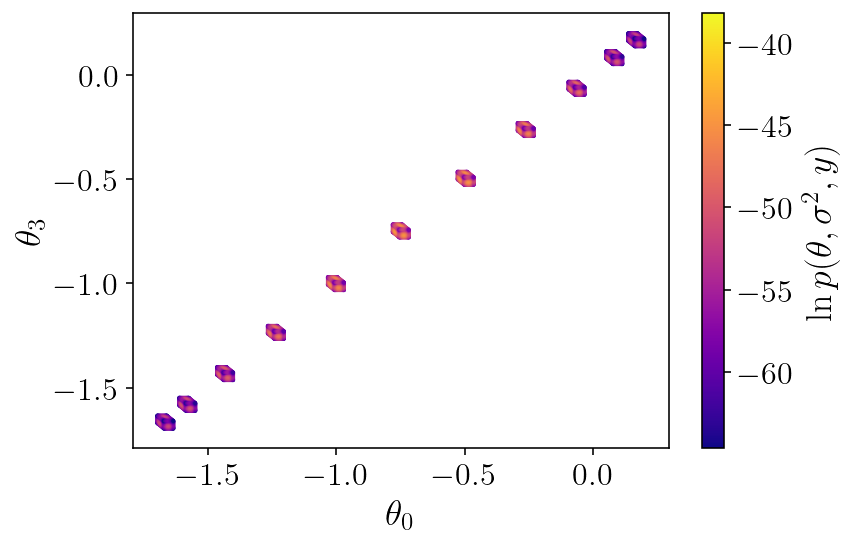

-3.9148086666390896


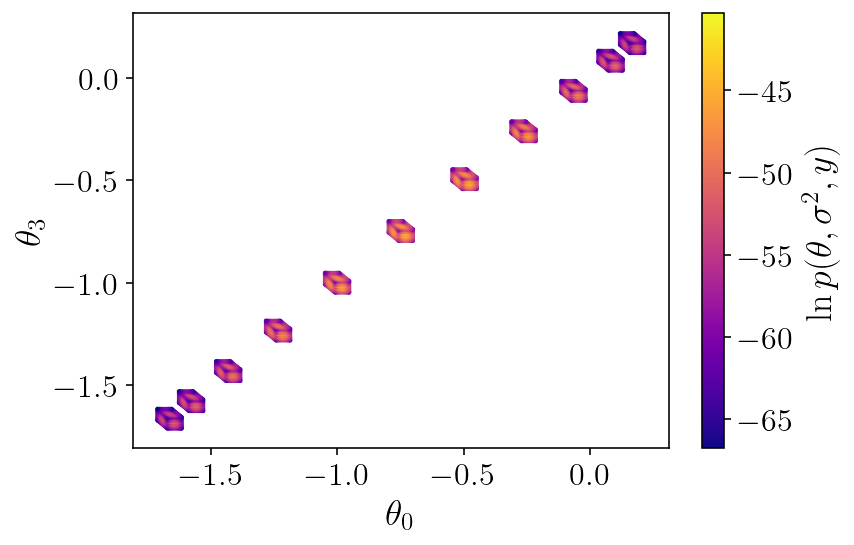

-3.511651962921401


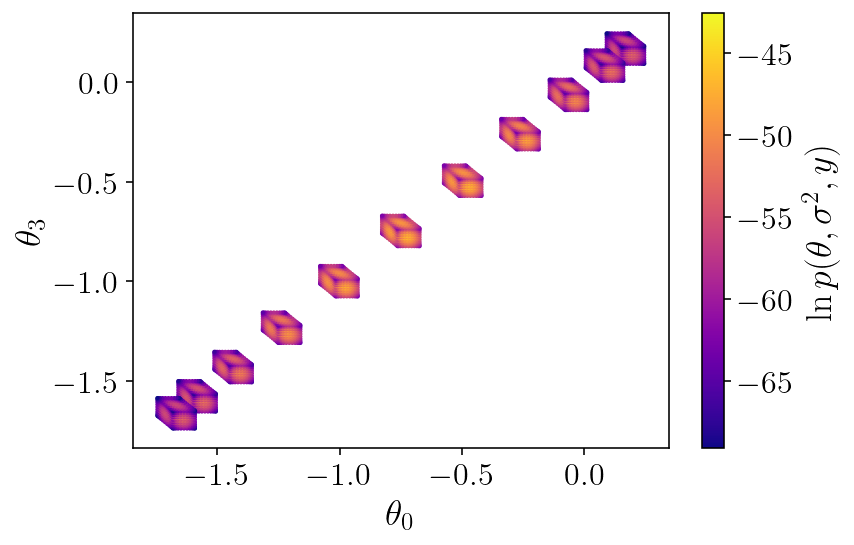

-3.0871712648889518


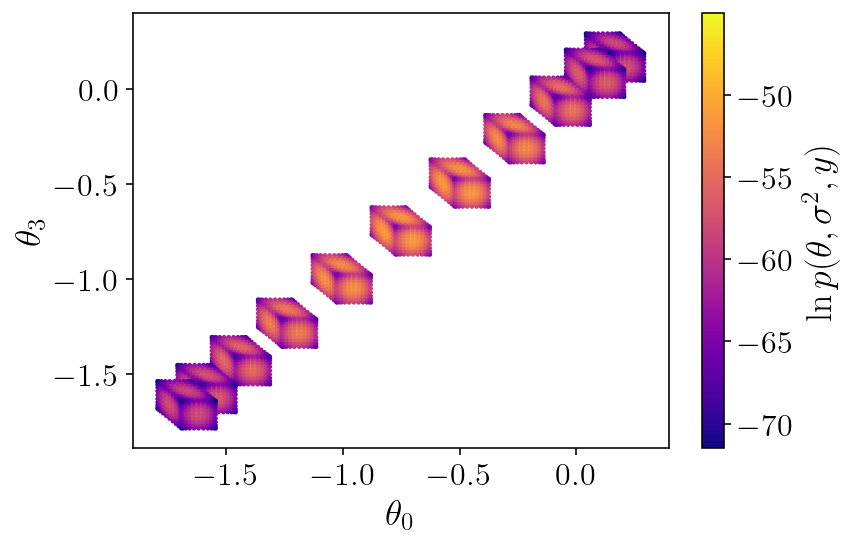

-2.645866167755504


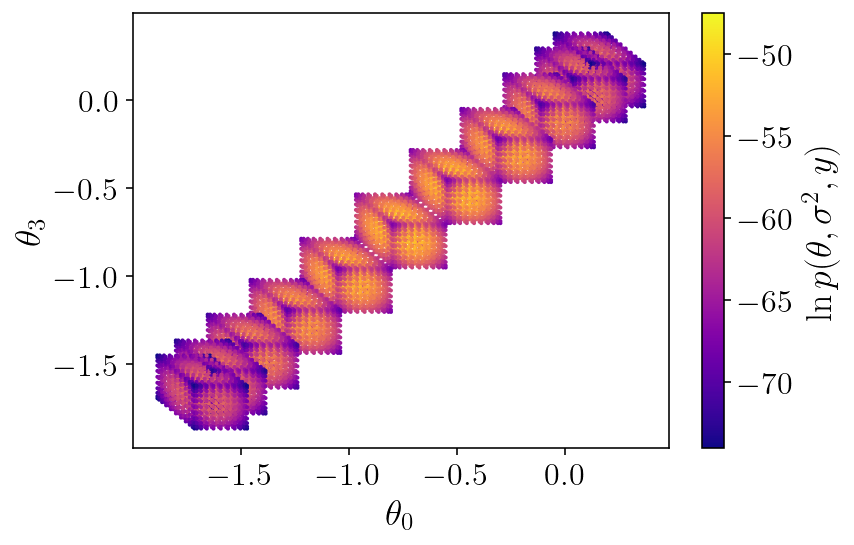

-2.1924146112386254


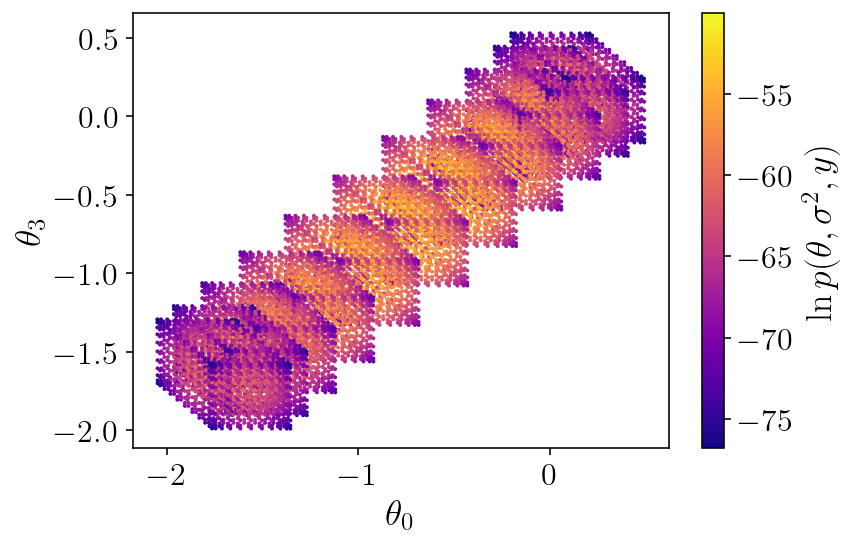

-1.7316232914989291


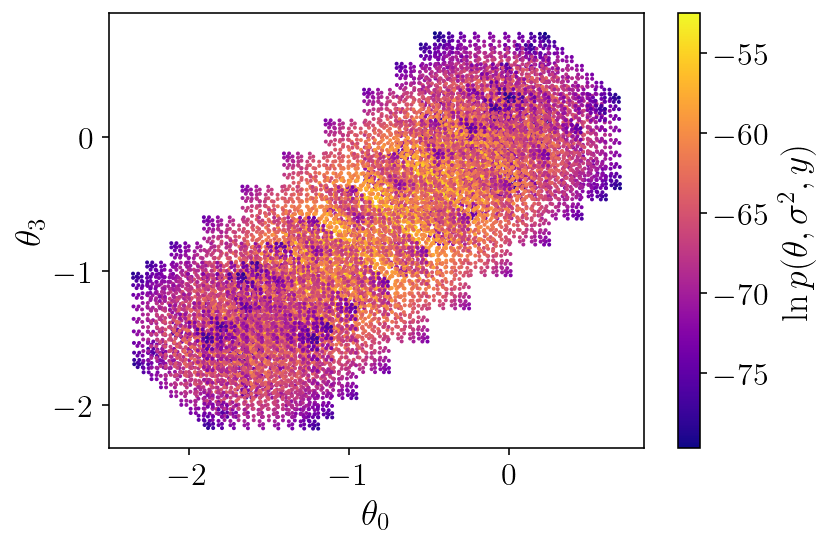

-1.26837670850107


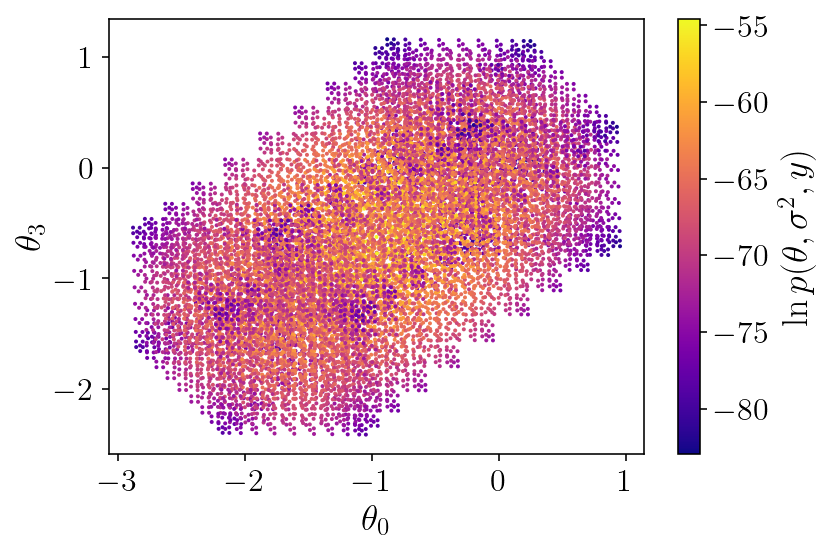

-0.8075853887613744


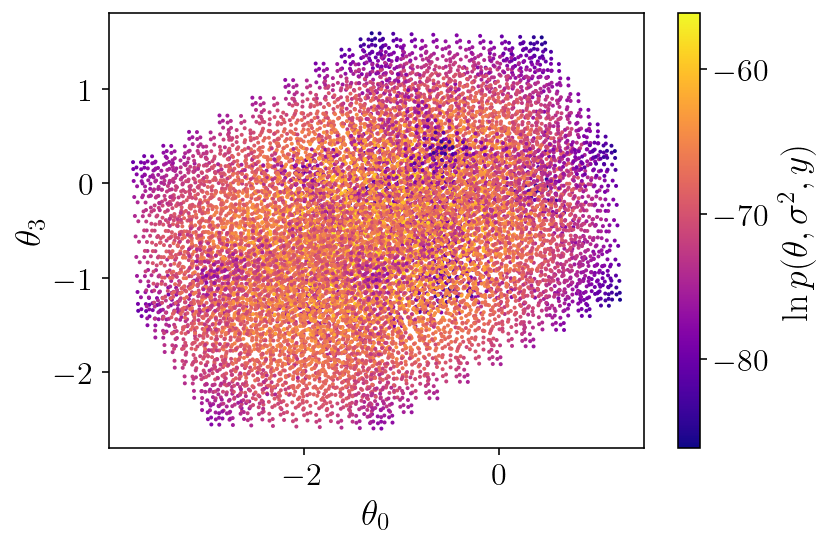

-0.354133832244496


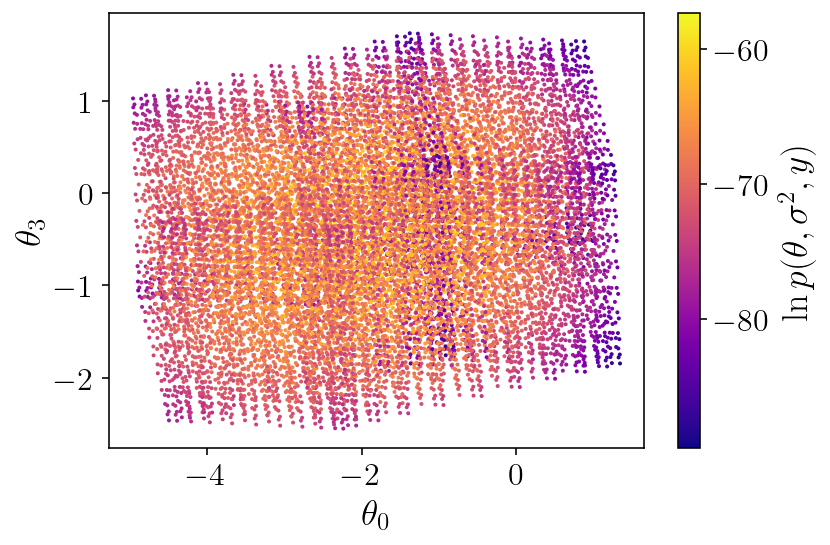

0.08717126488895177


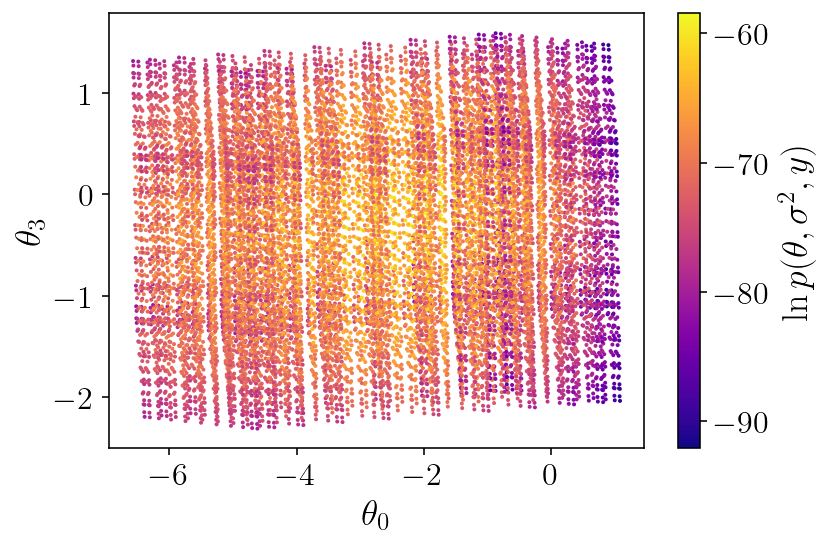

0.5116519629214004


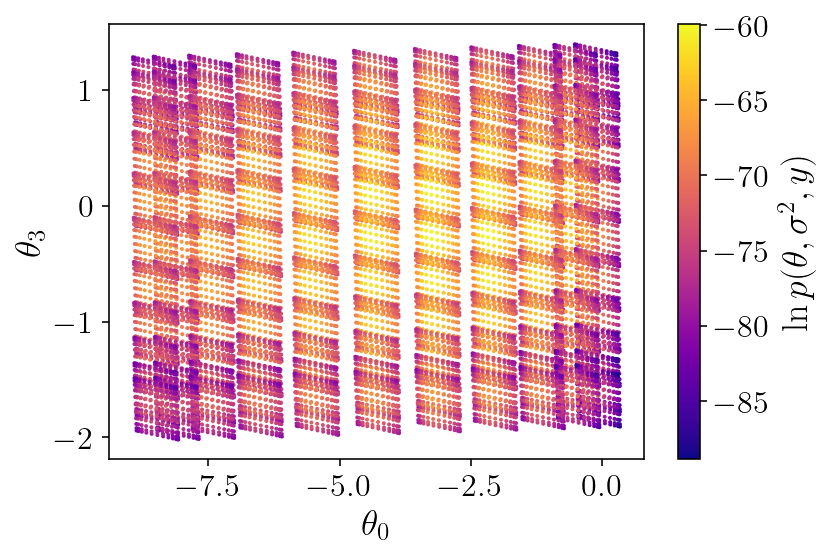

0.9148086666390887


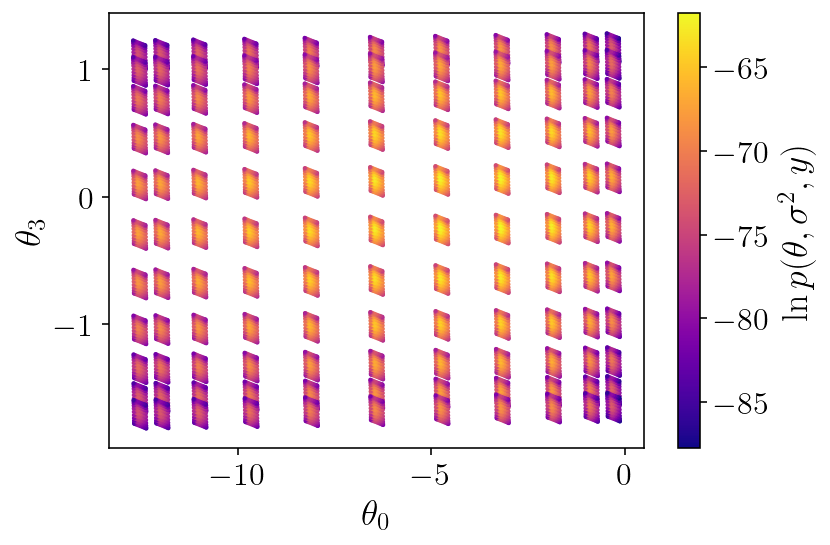

1.2923678234515918


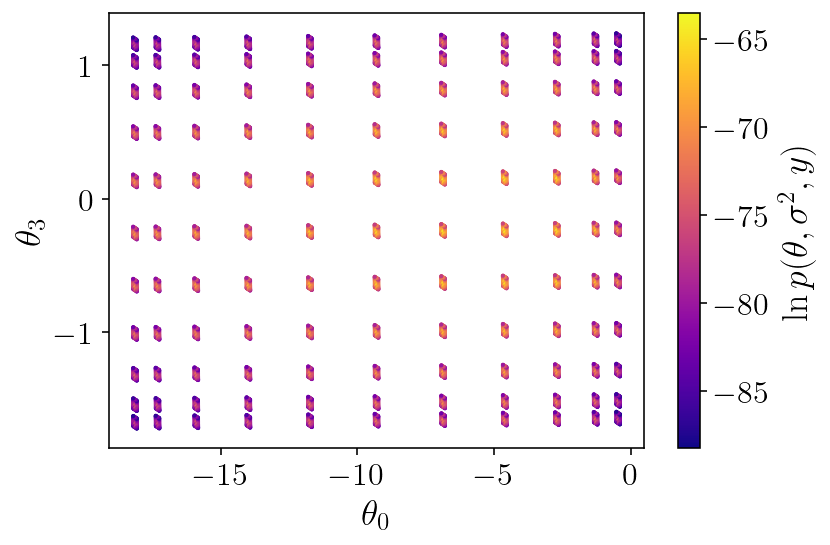

1.6403272265699211


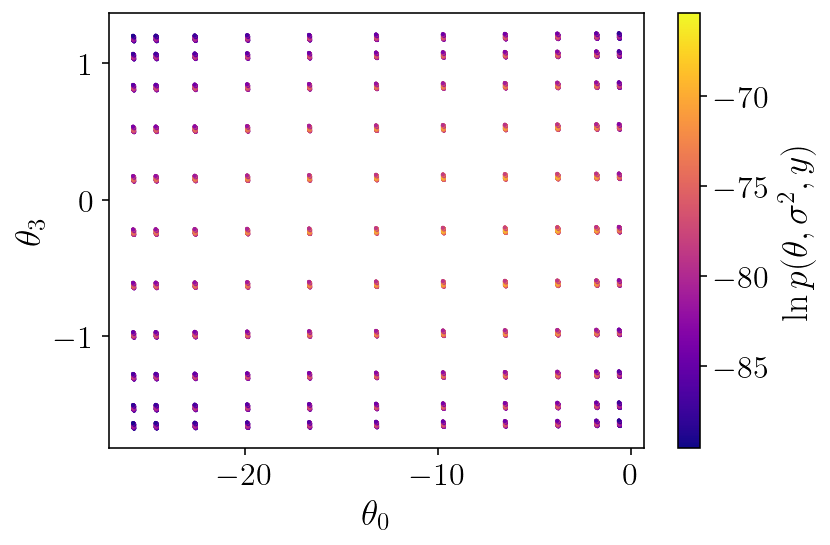

1.9549984444717177


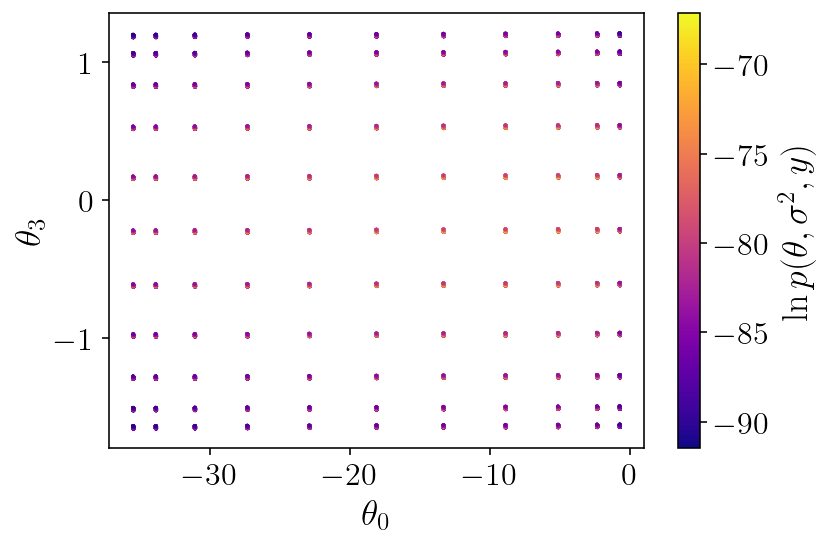

2.233045930722457


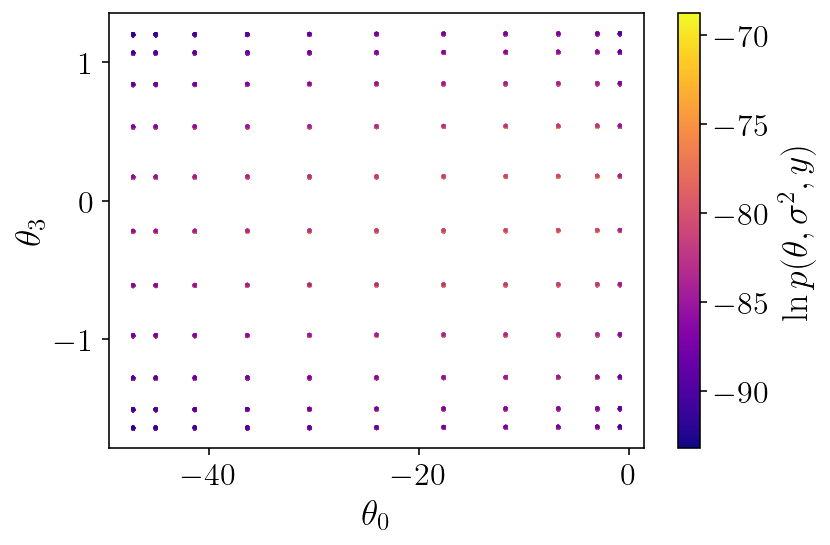

In [34]:
for si in range(5, 25, 1):
    print(np.log10(fi4.sigma2_rule.pts[si]))
    plt.scatter(
        grids[:, :, :, :, si, 0].ravel(),
        grids[:, :, :, :, si, 3].ravel(),
        c=logjt[:, :, :, :, si],
        s=1,
    )
    cbar = plt.colorbar()
    plt.xlabel(r"$\theta_0$")
    plt.ylabel(r"$\theta_3$")
    cbar.set_label(r"$\ln p(\theta, \sigma^2, y)$")
    plt.show()

# Old

In [10]:
n_theta = 11
w_theta = 10
integrate_sigma2 = False
fixed_arm_dim = None
fixed_arm_values = None

In [10]:
N, R = y.shape
S = fi.sigma2_n
integrate_thetas = list(range(fi.n_arms))
if fixed_arm_dim is not None:
    integrate_thetas.remove(fixed_arm_dim)

etapts, etawts = np.polynomial.legendre.leggauss(n_theta)
grid_eta = np.stack(
    np.meshgrid(*[etapts for k in integrate_thetas], indexing="ij"), axis=-1
)
grid_eta_wts = np.prod(
    np.stack(np.meshgrid(*[etawts for k in integrate_thetas], indexing="ij"), axis=-1),
    axis=-1,
)

# Compute mode and the inverse hessian at the mode via INLA!
if fixed_arm_dim is None:
    mode, hess_inv = fi.optimize_mode(y, n)
else:
    M = fixed_arm_values.shape[0]
    y_tiled = np.tile(y[:, None, :], (1, M, 1)).reshape((-1, R))
    n_tiled = np.tile(n[:, None, :], (1, M, 1)).reshape((-1, R))
    arm_values_tiled = np.tile(fixed_arm_values[None, :, None], (N, 1, S)).reshape(
        (-1, S)
    )
    mode, hess_inv = fi.optimize_mode(
        y_tiled,
        n_tiled,
        fixed_arm_dim=fixed_arm_dim,
        fixed_arm_values=arm_values_tiled,
    )

# Step 2: decorrelate our coordinate system.
# the negative of hess_inv is the covariance matrix. We take the subset
# corresponding to the dimensions we will be integrating over.
w, v = np.linalg.eigh(-hess_inv)
axis_half_len = np.sqrt(np.abs(w))

# Step 3: explore the coordinate system axis to determine the necessary domain scale.
mode_logjoint = fi.log_joint(y, n, mode)
log_tol = np.log(1e-10)
lr = 0.25
for eigen_idx in range(len(integrate_thetas)):
    dir_steps = np.empty((2, *mode.shape[:2]))
    for i, direction in enumerate([-1, 1]):
        step = np.full(mode.shape[:2], direction)
        for j in range(10):
            probe = (
                mode
                + axis_half_len[..., eigen_idx, None]
                * v[..., :, eigen_idx]
                * step[..., None]
            )
            logjoint = fi.log_joint(y, n, probe)
            delta = logjoint - mode_logjoint
            step = (1 - lr) * step + lr * step * (log_tol / delta)
            step[step * direction < 0] = direction
        dir_steps[i] = step
    # TODO: convergence test
    axis_half_len[..., eigen_idx] *= np.max(np.abs(dir_steps), axis=0)

# Map the coordinates from eta to theta space.
mode_subset = mode[..., integrate_thetas]
broadcast_shape = list(mode_subset.shape)
for i in range(len(integrate_thetas)):
    broadcast_shape.insert(1, 1)
grid_theta = np.einsum(
    "klij,...i,kli->k...lj", v, grid_eta, axis_half_len
) + mode_subset.reshape(broadcast_shape)

# Map the quadrature weights from eta to theta space.
# We need to multiply by the absolute value of the determinant of the
# transformation. Because we have already computed a eigendecomposition, the
# determinant of matrix is just product of eigenvalues.
det_jacobian = axis_half_len.prod(axis=-1)
grid_theta_wts = np.einsum("kl,...->k...l", det_jacobian, grid_eta_wts)

# Reshape the final results to:
# (N, n_theta1, ..., n_thetaM, n_sigma2, n_arms + 1)
# The entries corresponding to theta_i will be full_grid[..., i]
# while the entries corresponding to sigma2 will be full_grid[..., -1]
full_grid = np.empty((*grid_theta.shape[:-1], R + 1))
full_grid[..., integrate_thetas] = grid_theta
full_grid[..., fi.n_arms] = util.broadcast(
    fi.sigma2_rule.pts, full_grid.shape[:-1], [-1]
)
full_wts = grid_theta_wts
if fixed_arm_dim is not None:
    final_shape = [N, M] + list(full_grid.shape[1:])
    full_grid = full_grid.reshape(final_shape)
    full_grid[..., fixed_arm_dim] = util.broadcast(
        fixed_arm_values, full_grid.shape[:-1], [1]
    )
    full_wts = grid_theta_wts.reshape(final_shape[:-1])

if integrate_sigma2:
    full_wts *= util.broadcast(fi.sigma2_rule.wts, full_wts.shape, [-1])

10


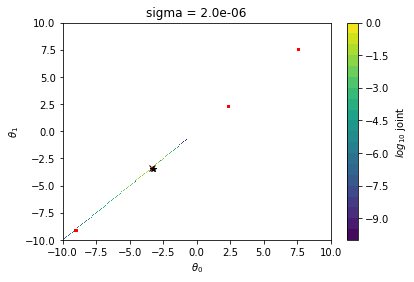

In [11]:
ts = np.linspace(-10, 10, 200)
theta2d = np.meshgrid(ts, ts, indexing="ij")
theta = np.stack([ti.ravel() for ti in theta2d], axis=-1)
for sig_idx in [10]:  # range(0, sigma2_n, 1):
    print(sig_idx)
    logjoint = calc_log_joint(theta, sig_idx)

    levels = np.linspace(-10, 0, 21)
    plt.contourf(
        theta2d[0], theta2d[1], logjoint.reshape(theta2d[0].shape), levels=levels
    )
    plt.plot(*mode[0, sig_idx], "kx")

    # plt.plot(new_pts[0, :, :, sig_idx,0].ravel(), new_pts[0, :,:,sig_idx,1].ravel(), 'ko', markersize=8)
    plt.plot(
        grid_theta[0, :, :, sig_idx, 0].ravel(),
        grid_theta[0, :, :, sig_idx, 1].ravel(),
        "ro",
        markersize=2,
    )

    plt.plot(
        *(mode[0, sig_idx] + axis_half_len[0, sig_idx, 0] * w_theta * v[0, sig_idx, 0]),
        "k*",
    )
    plt.plot(
        *(mode[0, sig_idx] + axis_half_len[0, sig_idx, 1] * w_theta * v[0, sig_idx, 1]),
        "k*",
    )
    plt.xlabel(r"$\theta_0$")
    plt.ylabel(r"$\theta_1$")

    plt.title(f"sigma = {sigma2_rule.pts[sig_idx]:.1e}")
    cbar = plt.colorbar()
    cbar.set_label("$log_{10}$ joint")
    plt.xlim([ts.min(), ts.max()])
    plt.ylim([ts.min(), ts.max()])
    plt.show()

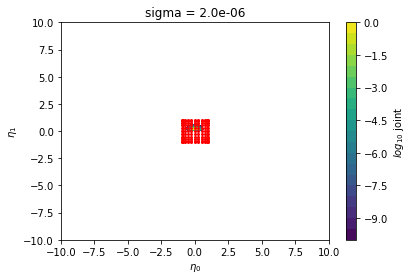

In [12]:
sig_idx = 10
eta = np.stack([ti.ravel() for ti in theta2d], axis=-1)
theta = (eta * axis_half_len[0, sig_idx]).dot(v[0, sig_idx])
logjoint = calc_log_joint(theta, sig_idx)

levels = np.linspace(-10, 0, 21)
plt.contourf(theta2d[0], theta2d[1], logjoint.reshape(theta2d[0].shape), levels=levels)

plt.plot(grid_eta[:, :, 0].ravel(), grid_eta[:, :, 1].ravel(), "ro", markersize=2)
plt.xlabel(r"$\eta_0$")
plt.ylabel(r"$\eta_1$")

plt.title(f"sigma = {sigma2_rule.pts[sig_idx]:.1e}")
cbar = plt.colorbar()
cbar.set_label("$log_{10}$ joint")
plt.xlim([ts.min(), ts.max()])
plt.ylim([ts.min(), ts.max()])
plt.show()

In [13]:
sigma2_post_fi, _, _, _ = fi.inference(np.stack((y, n), axis=-1))

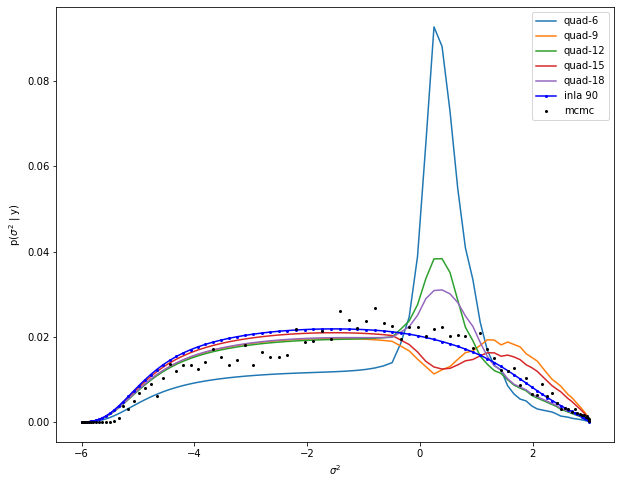

In [14]:
plt.figure(figsize=(10, 8))
for nq in [6, 9, 12, 15, 18]:
    full_grid, full_wts = quadrature.build_grid(
        fi, y, n, integrate_sigma2=False, n_theta=nq, w_theta=w_theta
    )
    pr = full_grid[..., :2].reshape((-1, fi.sigma2_n, fi.n_arms))
    log_joint = fi.log_joint(y, n, pr).reshape(full_grid.shape[:-1])
    integral = (np.exp(log_joint) * full_wts).sum(axis=(1, 2))
    denom = (integral * fi.sigma2_rule.wts).sum()
    integral[0] /= denom
    plt.plot(
        np.log10(fi.sigma2_rule.pts),
        integral[0] * fi.sigma2_rule.wts,
        label=f"quad-{nq}",
    )
plt.plot(
    np.log10(fi.sigma2_rule.pts),
    sigma2_post_fi[0] * fi.sigma2_rule.wts,
    "b-o",
    markersize=2,
    label="inla 90",
)
plt.plot(np.log10(fi.sigma2_rule.pts), mcmc_pdf, "ko", markersize=2, label="mcmc")
plt.legend()
plt.xlabel("$\sigma^2$")
plt.ylabel("p($\sigma^2$ | y)")
plt.show()

/var/folders/mt/cmys2v_143q1kpcrdt5wcdyr0000gn/T/ipykernel_89163/335717603.py:13: RuntimeWarning: divide by zero encountered in log10
  plt.plot(np.log10(fi.sigma2_rule.pts), np.log10(mcmc_pdf / fi.sigma2_rule.wts), 'mo', markersize=2, label='mcmc')


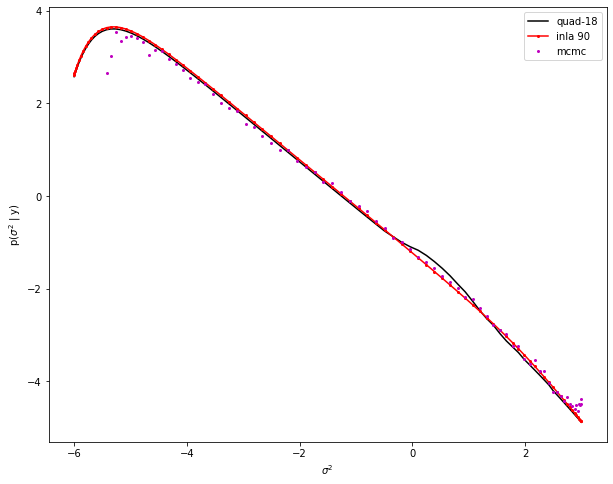

In [15]:
plt.figure(figsize=(10, 8))
for nq in [18]:
    full_grid, full_wts = quadrature.build_grid(
        fi, y, n, integrate_sigma2=False, n_theta=nq, w_theta=w_theta
    )
    pr = full_grid[..., :2].reshape((-1, fi.sigma2_n, fi.n_arms))
    log_joint = fi.log_joint(y, n, pr).reshape(full_grid.shape[:-1])
    integral = (np.exp(log_joint) * full_wts).sum(axis=(1, 2))
    denom = (integral * fi.sigma2_rule.wts).sum()
    integral[0] /= denom
    plt.plot(
        np.log10(fi.sigma2_rule.pts), np.log10(integral[0]), "k-", label=f"quad-{nq}"
    )
plt.plot(
    np.log10(fi.sigma2_rule.pts),
    np.log10(sigma2_post_fi[0]),
    "r-o",
    markersize=2,
    label="inla 90",
)
plt.plot(
    np.log10(fi.sigma2_rule.pts),
    np.log10(mcmc_pdf / fi.sigma2_rule.wts),
    "mo",
    markersize=2,
    label="mcmc",
)
plt.legend()
plt.xlabel("$\sigma^2$")
plt.ylabel("p($\sigma^2$ | y)")
plt.show()

In [16]:
ti_N = 101
ti_rule = util.simpson_rule(ti_N, -6.0, 2.0)

In [28]:
grids, wts = quadrature.build_grid(
    fi, y, n, fixed_arm_dim=0, fixed_arm_values=ti_rule.pts, n_theta=21
)
grids_ravel = grids[..., : fi.n_arms].reshape((-1, fi.sigma2_n, fi.n_arms))
logjoint = fi.log_joint(y[None, :], n[None, :], grids_ravel).reshape(grids.shape[:-1])

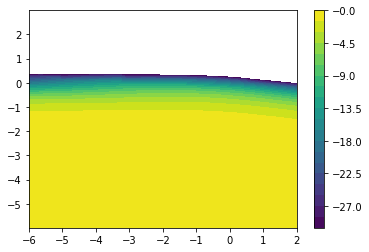

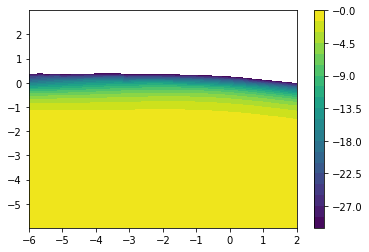

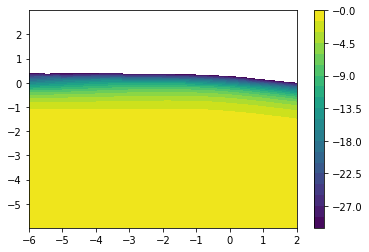

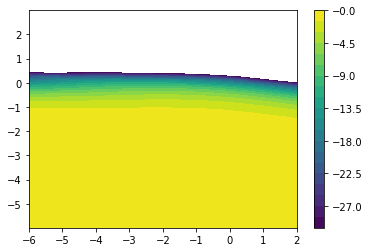

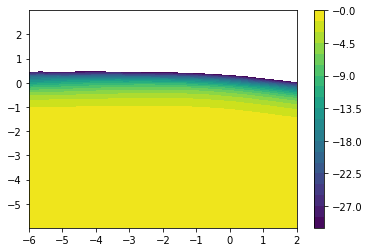

...

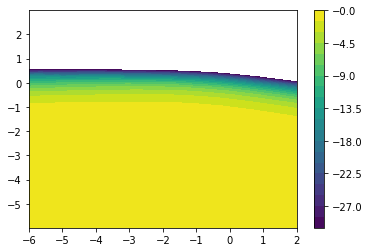

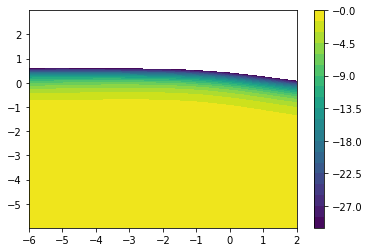

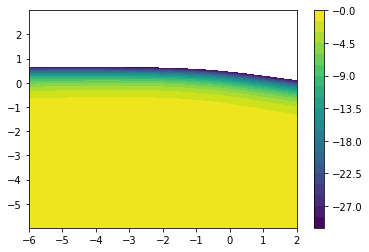

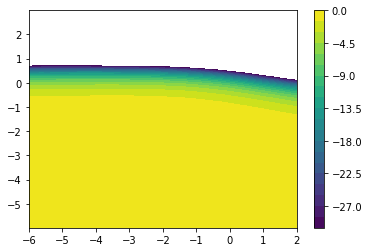

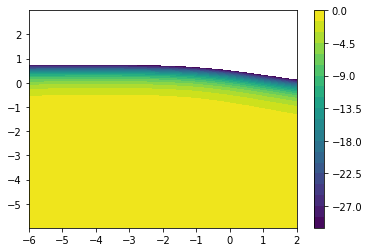

In [29]:
for i in range(0, 11, 1):
    field = logjoint[0, :, i, :] * fi.sigma2_rule.wts
    levels = np.linspace(np.max(field) - 30, np.max(field), 21)
    plt.contourf(
        grids[0, :, i, :, 0], np.log10(grids[0, :, i, :, 2]), field, levels=levels
    )
    plt.colorbar()
    plt.show()

In [30]:
grids[0, :, :, i, 1]

array([[-6.02007212, -6.01953625, -6.01858416, ..., -5.98140779,
        -5.9804557 , -5.97991983],
       [-5.94007214, -5.93953626, -5.93858418, ..., -5.9014078 ,
        -5.90045572, -5.89991984],
       [-5.86007215, -5.85953628, -5.85858419, ..., -5.82140782,
        -5.82045573, -5.81991986],
       ...,
       [ 1.81982393,  1.8203598 ,  1.82131187, ...,  1.85848772,
         1.85943979,  1.85997566],
       [ 1.8998217 ,  1.90035757,  1.90130965, ...,  1.93848552,
         1.93943759,  1.93997346],
       [ 1.97981956,  1.98035543,  1.98130751, ...,  2.0184834 ,
         2.01943547,  2.01997134]])

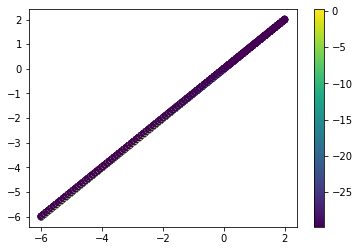

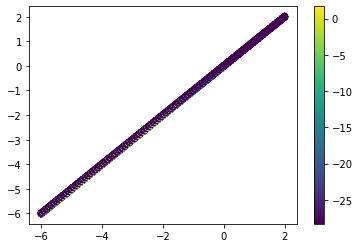

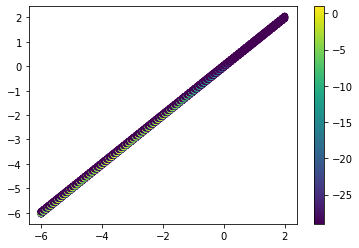

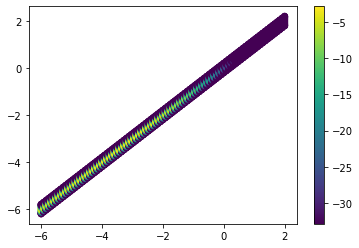

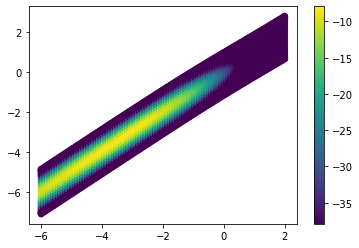

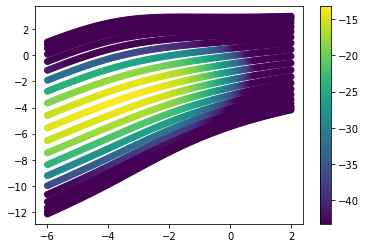

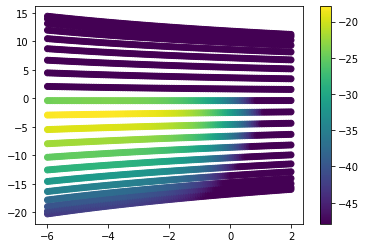

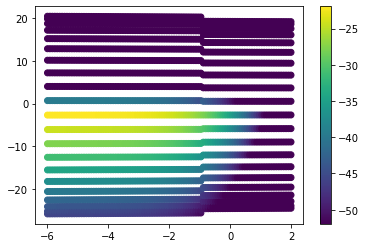

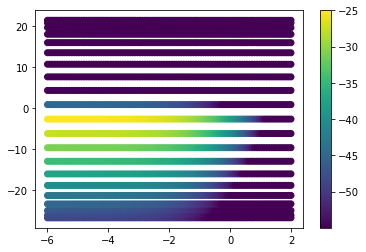

In [31]:
for i in range(0, 90, 10):
    field = logjoint[0, :, :, i]
    vmax = np.max(field)
    vmin = vmax - 30
    levels = np.linspace(vmin, vmax, 21)
    plt.scatter(
        grids[0, :, :, i, 0], grids[0, :, :, i, 1], c=field, vmin=vmin, vmax=vmax
    )
    # plt.contourf(grids[0, :, :, i, 0], grids[0, :, :, i, 1], field, levels=levels)
    plt.colorbar()
    plt.show()

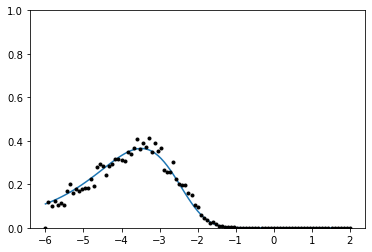

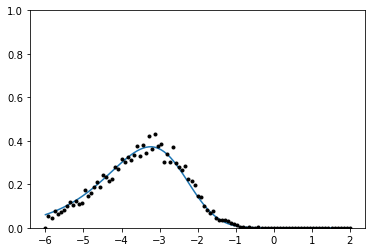

In [32]:
for arm_idx in range(2):
    mcmc_arm = results_mcmc["x"][0]["theta"][0, :, arm_idx].to_py()
    mcmc_arm_cdf = (mcmc_arm[None, :] < ti_rule.pts[:, None]).sum(axis=1)
    mcmc_arm_pdf = np.zeros(ti_rule.pts.shape[0])
    mcmc_arm_pdf[1:] = (mcmc_arm_cdf[1:] - mcmc_arm_cdf[:-1]) / mcmc_arm.shape[0]
    mcmc_arm_pdf /= np.sum(mcmc_arm_pdf * ti_rule.wts)

    quad_p_ti_g_y = quadrature.integrate(
        fi, y, n, fixed_arm_dim=arm_idx, fixed_arm_values=ti_rule.pts, n_theta=21
    )
    quad_p_ti_g_y /= np.sum(quad_p_ti_g_y * ti_rule.wts, axis=1)[:, None]
    plt.plot(ti_rule.pts, quad_p_ti_g_y[0])
    plt.plot(ti_rule.pts, mcmc_arm_pdf, "k.")
    plt.ylim([0, 1.0])
    plt.show()

## A different quadrature 4d approach

In [ ]:
n_theta = 11
integrate_thetas = list(range(fi.n_arms))
etapts, etawts = np.polynomial.legendre.leggauss(n_theta)
grid_eta = np.stack(
    np.meshgrid(*[etapts for k in integrate_thetas], indexing="ij"), axis=-1
)
grid_eta_wts = np.prod(
    np.stack(np.meshgrid(*[etawts for k in integrate_thetas], indexing="ij"), axis=-1),
    axis=-1,
)
mode, hess_inv = fi.optimize_mode(y, n)
log_tol = np.log(1e-3)

In [ ]:
n

array([[20, 20, 35, 35]])

In [ ]:
w, v = np.linalg.eigh(-hess_inv[0, sig_idx])
axis_half_len = np.sqrt(np.abs(w))
mode_logjoint = fi.log_joint(y, n, mode)[0, sig_idx]
print("")
print(sig_idx)

for eigen_idx in range(len(integrate_thetas)):
    for direction in [-1, 1]:

        def f(x):
            probe = mode[0, sig_idx].copy()
            probe[..., integrate_thetas] += (
                axis_half_len[..., eigen_idx, None]
                * v[..., :, eigen_idx]
                * x
                * direction
            )
            return fi.log_joint(y, n, probe)[0, sig_idx] - mode_logjoint - log_tol

        print(eigen_idx, direction, scipy.optimize.bisect(f, 0, 100))


20
0 -1 3.7169221888447623
0 1 3.7169221888305515
1 -1 3.7169221495091165
1 1 3.7169222282742
2 -1 3.716922188688443
2 1 3.716922188688443
3 -1 4.12051200038519
3 1 3.4499840809090188

21
0 -1 3.716922188708338
0 1 3.7169221886799164
1 -1 3.716922132356615
1 1 3.7169222455801787
2 -1 3.716922188608862
2 1 3.716922188603178
3 -1 4.120511095526069
3 1 3.4499844682315484

22
0 -1 3.71692218860602
0 1 3.716922188554861
1 -1 3.7169221064445424
1 1 3.7169222714354078
2 -1 3.716922188688443
2 1 3.71692218867139
3 -1 4.120509894012514
3 1 3.4499849825053275

23
0 -1 3.7169221887623394
0 1 3.7169221886685477
1 -1 3.716922066932682
1 1 3.7169223105522065
2 -1 3.7169221887765502
2 1 3.716922188739602
3 -1 4.120508288220037
3 1 3.449985669764999

24
0 -1 3.716922188603178
0 1 3.7169221884155945
1 -1 3.7169220065592867
1 1 3.716922370882969
2 -1 3.7169221887282333
2 1 3.7169221886685477
3 -1 4.120506128482759
3 1 3.449986593996357

25
0 -1 3.7169221884809645
0 1 3.71692218810864
1 -1 3.71692191288

In [ ]:
for eigen_idx in range(len(integrate_thetas)):
    for i, direction in enumerate([-1, 1]):
        for j in range(1, 30)[::-1]:
            probe = mode[0, sig_idx].copy()
            probe[..., integrate_thetas] += (
                axis_half_len[..., eigen_idx, None]
                * v[..., :, eigen_idx]
                * j
                * direction
            )
            logjoint = fi.log_joint(y, n, probe)[0, sig_idx]
            delta = logjoint - mode_logjoint
            print(delta)

-420.5001285515614
-392.0001117629716
-364.50009663089565
-338.0000830519539
-312.5000709243816
-288.0000601482702
-264.50005062581295
-242.00004226152964
-220.5000349624923
-200.0000286385342
-180.50002320245937
-162.0000185702316
-144.50001466116746
-128.00001139810718
-112.5000087075887
-98.00000652000296
-84.5000047697443
-72.00000339535154
-60.50000233963792
-50.00000154981371
-40.50000097759803
-32.000000579317536
-24.500000316005675
-18.00000015347898
-12.500000062414799
-8.000000018410944
-4.500000002043691
-1.9999999989074837
-0.499999999650683
-420.5001557009919
-392.0001362129172
-364.5001185651987
-338.00010264820463
-312.50008835388576
-288.00007557601555
-264.5000642104372
-242.0000541552913
-220.50004531124011
-200.00003758168037
-180.50003087295187
-162.00002509452924
-144.5000201592142
-128.0000159833121
-112.50001248680249
-98.00000959349683
-84.50000723119095
-72.00000533180952
-60.500003831532105
-50.00000267092103
-40.50000179503376
-32.00000115352294
-24.500000700

## Explore 4D quadrature bug 2

In [ ]:
def explore_slice(select_dim, sig_idxs, slice="max_idx", exp=False):
    plt.figure(figsize=(12, 8), constrained_layout=True)
    for i, sig_i in enumerate(sig_idxs):
        plt.subplot(2, 3, i + 1)
        sig_slice = logjt[0, :, :, :, :, sig_i]

        if slice == "max_idx":
            max_ravel_idx = np.argmax(sig_slice.ravel())
            max_idx = np.unravel_index(max_ravel_idx, sig_slice.shape)
            idx = [0, np.s_[:], np.s_[:], np.s_[:], np.s_[:], sig_i]
            for j in range(4):
                if j not in select_dim:
                    idx[1 + j] = max_idx[j]
        elif isinstance(slice, tuple):
            idx = [0, np.s_[:], np.s_[:], np.s_[:], np.s_[:], sig_i]
            set_dim = list(range(4))
            for d in select_dim:
                set_dim.remove(d)
            for j, d in enumerate(set_dim):
                idx[1 + d] = slice[j]

        idx = tuple(idx)
        f = logjt[idx]
        pts = grids[idx]

        # Identify the two dimensions with the most remaining spatial variation.
        # These will be the two dimensions that we plot.
        dim_width = np.max(pts, axis=(0, 1)) - np.min(pts, axis=(0, 1))
        plot_dims = dim_width.argsort()[-2:]
        plot_dims.sort()

        x = pts[..., plot_dims[0]]
        y = pts[..., plot_dims[1]]

        if exp:
            f = np.exp(f)
            vmax = np.max(f)
            vmin = 0
        else:
            vmax = np.max(f)
            vmin = vmax - 30
        plt.scatter(x, y, c=f, vmin=vmin, vmax=vmax)
        plt.xlabel(r"$\theta_" + str(plot_dims[0]) + "$")
        plt.ylabel(r"$\theta_" + str(plot_dims[1]) + "$")
        plt.colorbar()
    plt.show()

In [ ]:
ti_rule = util.simpson_rule(51, -6, 2)
grids, wts, logjt = quadrature.build_grid(
    fi4, y4, n4, fixed_arm_dim=0, fixed_arm_values=ti_rule.pts, n_theta=13, tol=1e-6
)

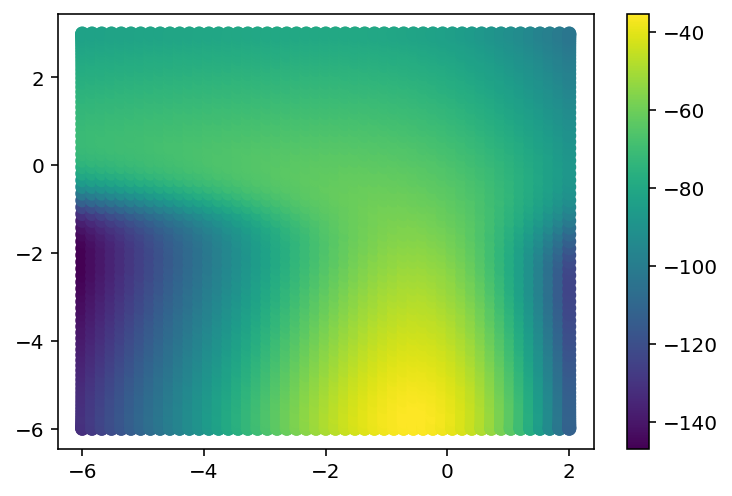

In [ ]:
slice = logjt[0, :, :, :, :, :]
integrate_dims = list(range(1, 4))
maxv = slice.max(axis=tuple(integrate_dims))
plt.scatter(grids[0, :, 0, 0, 0, :, 0], np.log10(grids[0, :, 0, 0, 0, :, 4]), c=maxv)
plt.colorbar()
plt.show()

In [ ]:
maxv = np.expand_dims(maxv, (1, 2))

(51, 13, 13, 90)
0


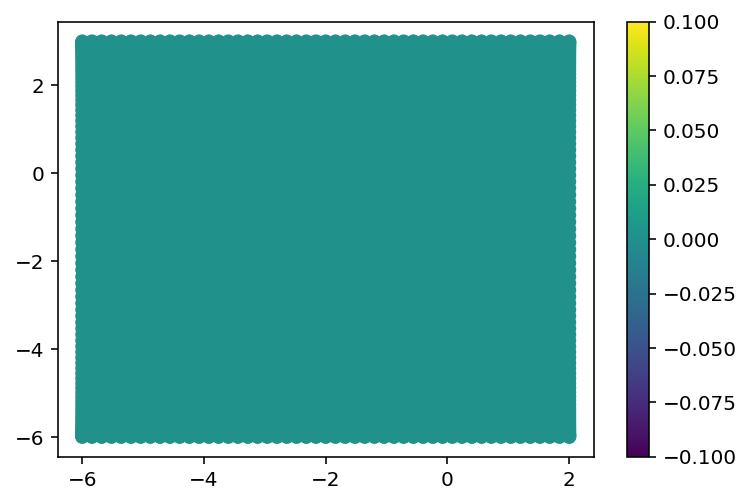

(51, 13, 13, 90)
0


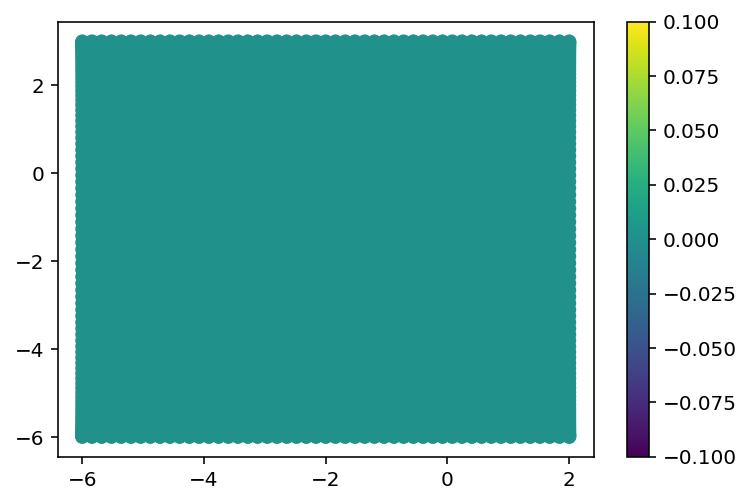

(51, 13, 13, 90)
0


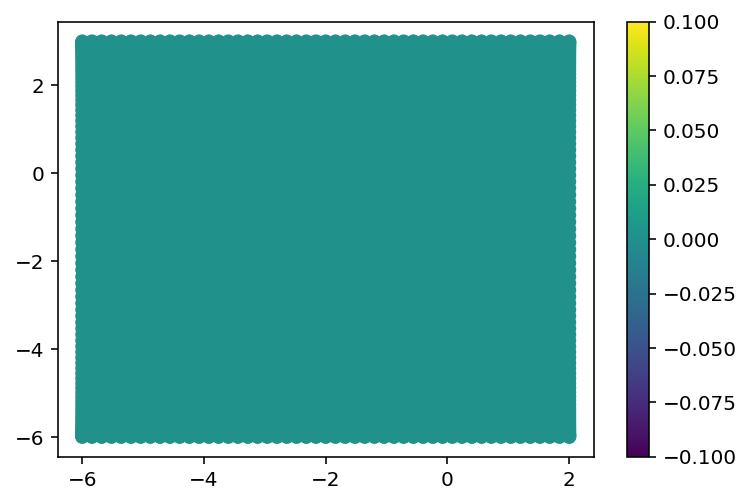

(51, 13, 13, 90)
0


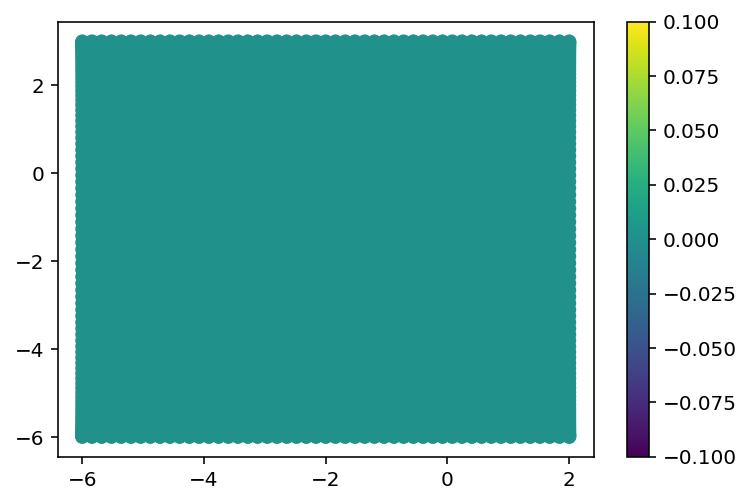

(51, 13, 13, 90)
0


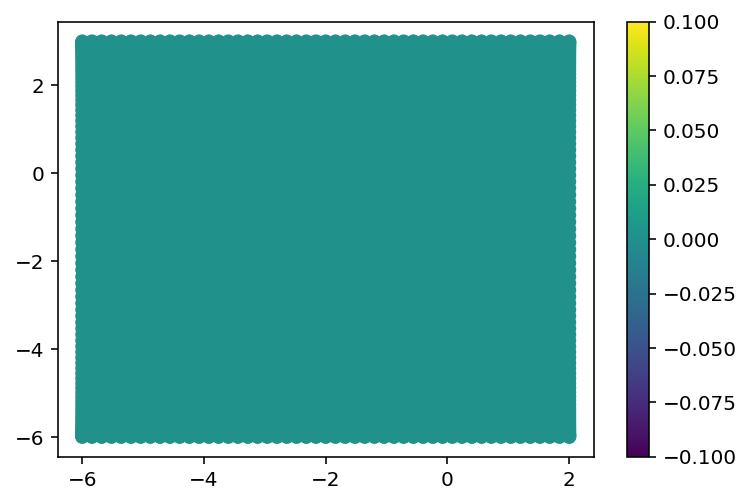

(51, 13, 13, 90)
0


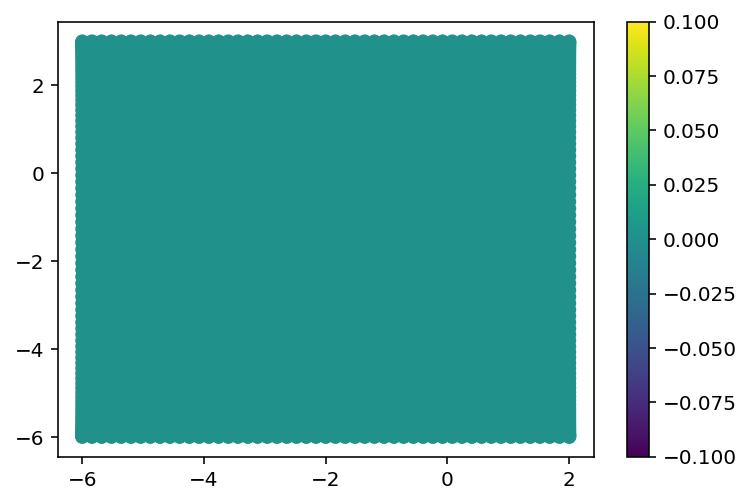

In [ ]:
log_tol = -4.5
for dim in range(3):
    for dir in [-1, 1]:
        idx = [np.s_[:]] * 5
        idx[1 + dim] = dir
        idx = tuple(idx)
        print(slice[idx].shape)
        fail = np.any(slice[idx] - maxv > log_tol, axis=(1, 2))
        print(np.sum(fail))
        plt.scatter(
            grids[0, :, 0, 0, 0, :, 0], np.log10(grids[0, :, 0, 0, 0, :, 4]), c=fail
        )
        plt.colorbar()
        plt.show()

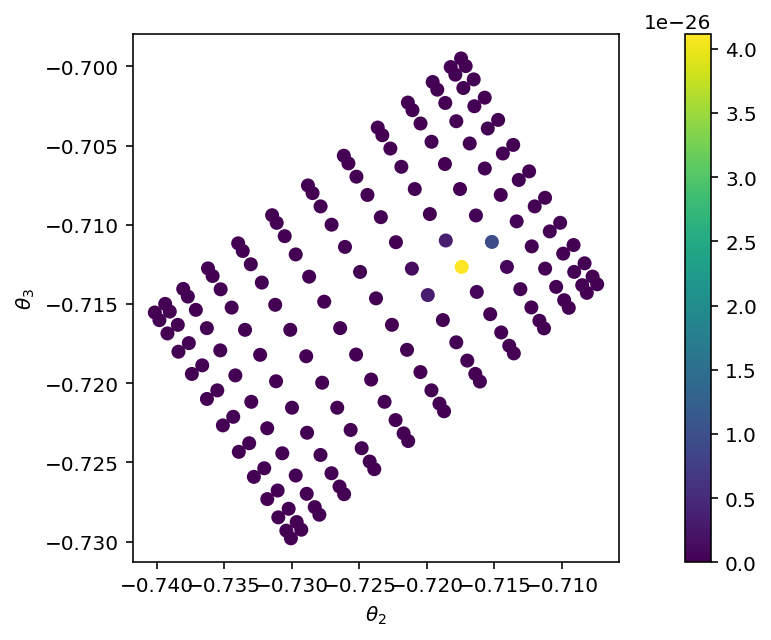

In [ ]:
for i in range(1):
    explore_slice([1, 3], [3], slice=(33, i), exp=True)
# explore_slice([0,1], [38], slice=(12, 12))
# explore_slice([0,1], [38], slice='max_idx')

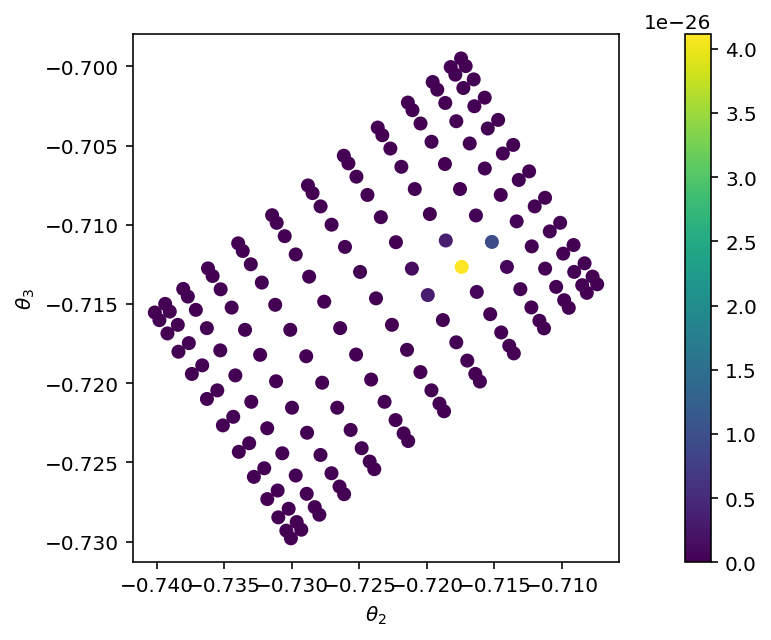

In [ ]:
for i in range(1):
    explore_slice([1, 3], [3], slice=(33, i), exp=True)
# explore_slice([0,1], [38], slice=(12, 12))
# explore_slice([0,1], [38], slice='max_idx')

## Explore 4D quadrature bug 1

In [ ]:
fi4.sigma2_rule.pts[38]

0.003113384915269016

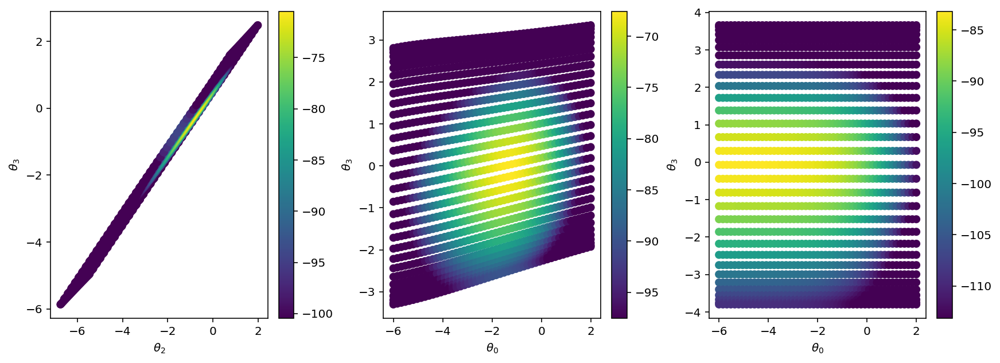

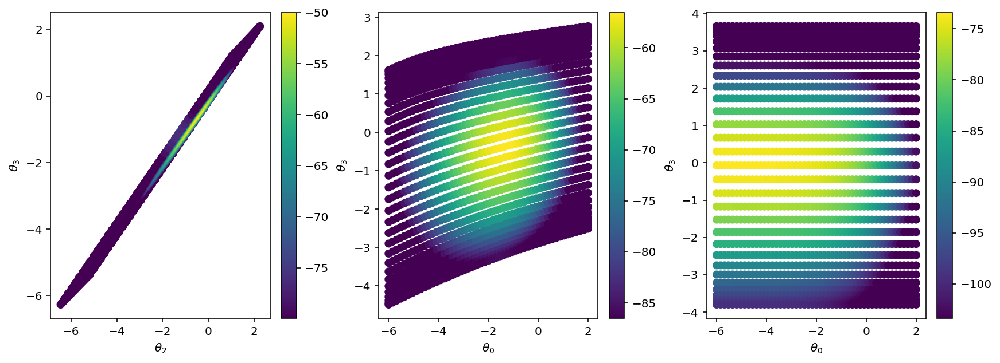

In [ ]:
explore_slice([0, 1], [40, 50, 89], slice=(12, 12))
explore_slice([0, 1], [40, 50, 89], slice="max_idx")

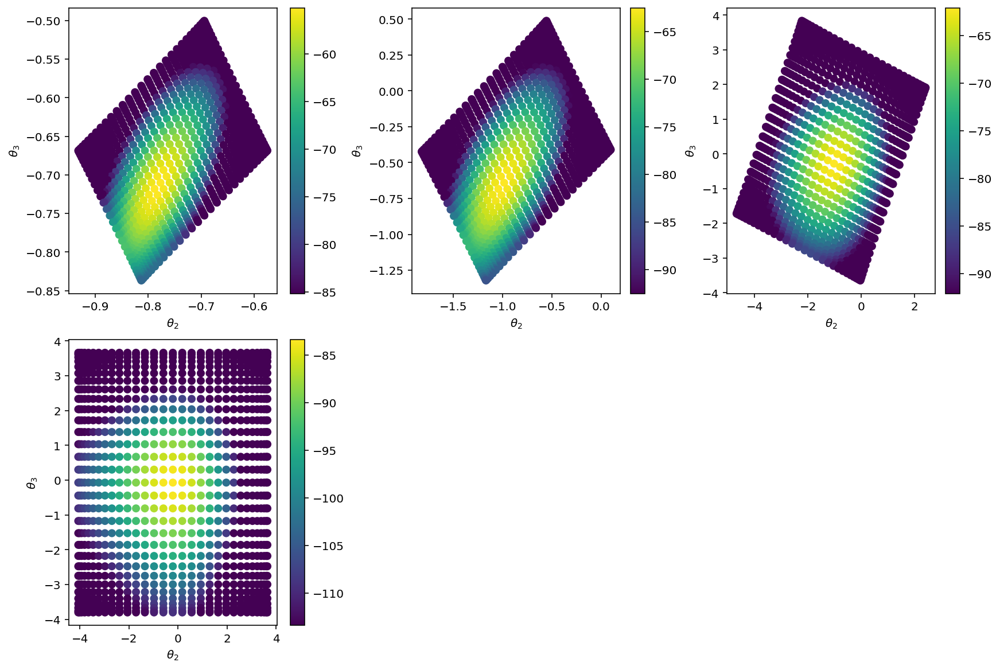

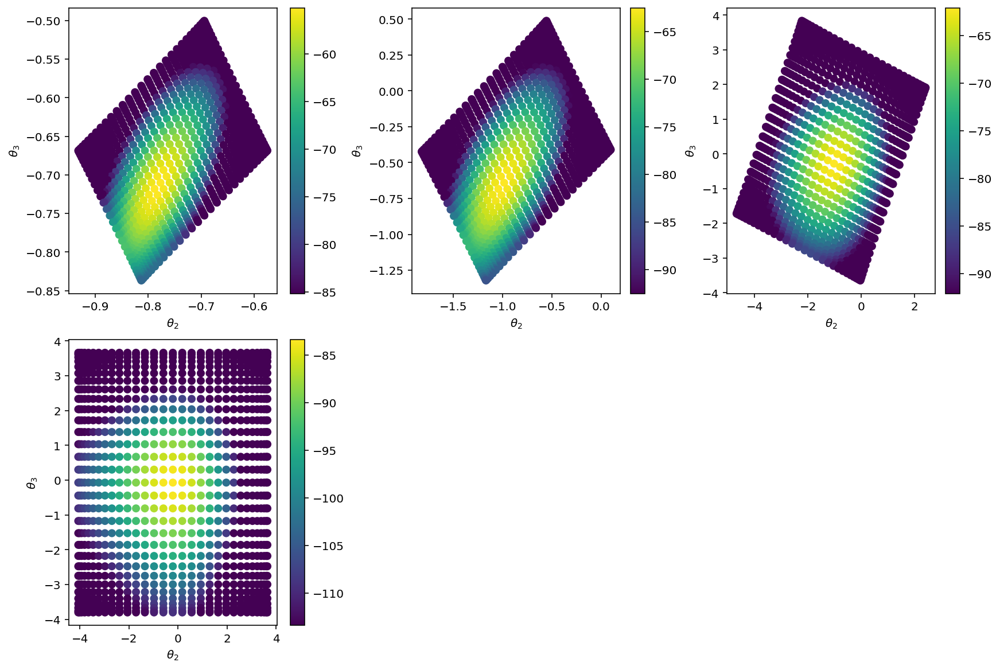

done
done
done
done
done


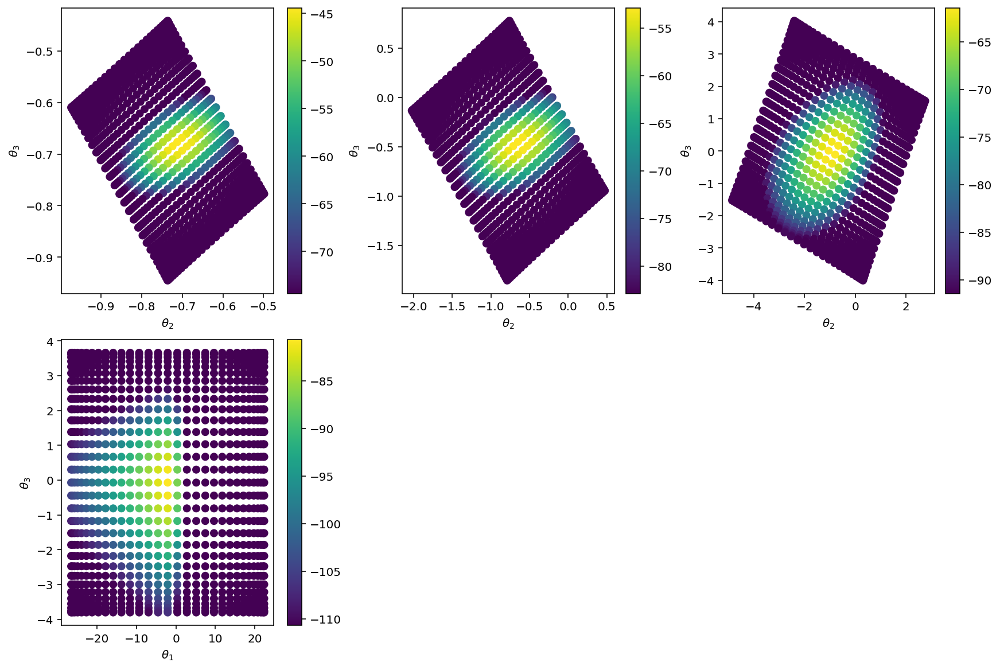

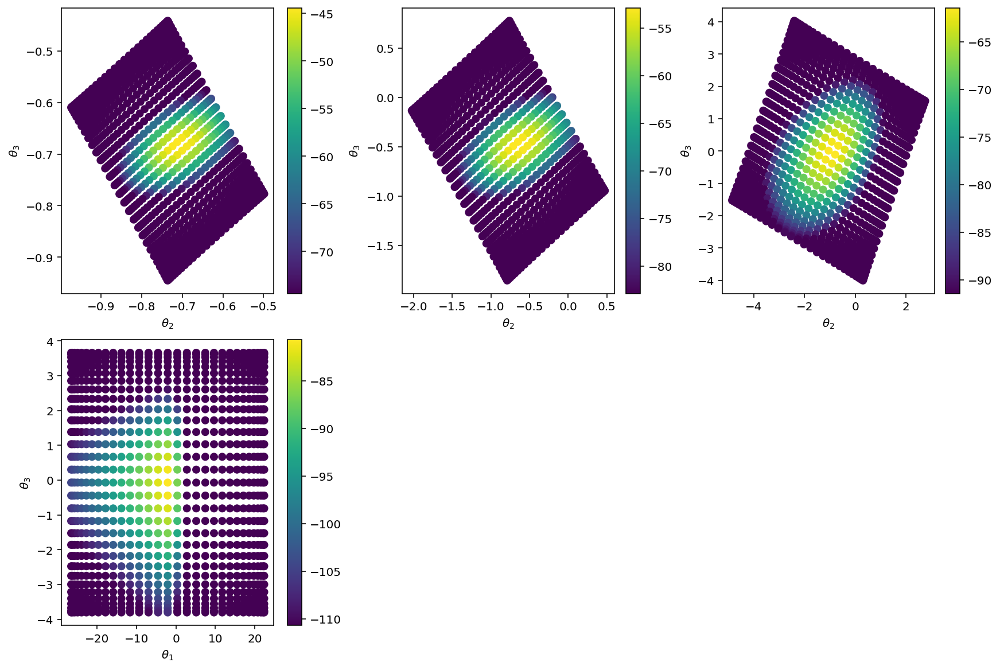

done
done
done
done
done


[None, None, None, None, None]

In [ ]:
# 33 -0.7199999999999998
explore_max_slice([1, 2], [30, 40, 50, 89], slice=(33, 12))
explore_max_slice([1, 2], [30, 40, 50, 89], slice=(33, 12))
[print("done") for i in range(5)]
explore_max_slice([1, 3], [30, 40, 50, 89], slice=(33, 12))
explore_max_slice([1, 3], [30, 40, 50, 89], slice=(33, 12))
[print("done") for i in range(5)]

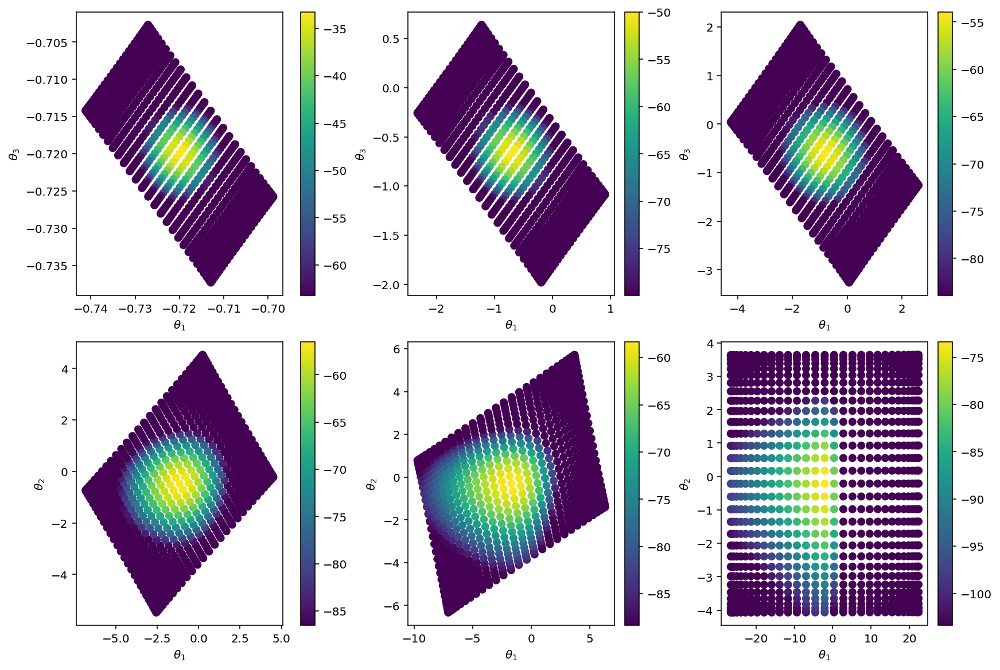

In [ ]:
explore_max_slice([2, 3], [0, 40, 45, 50, 55, 89])

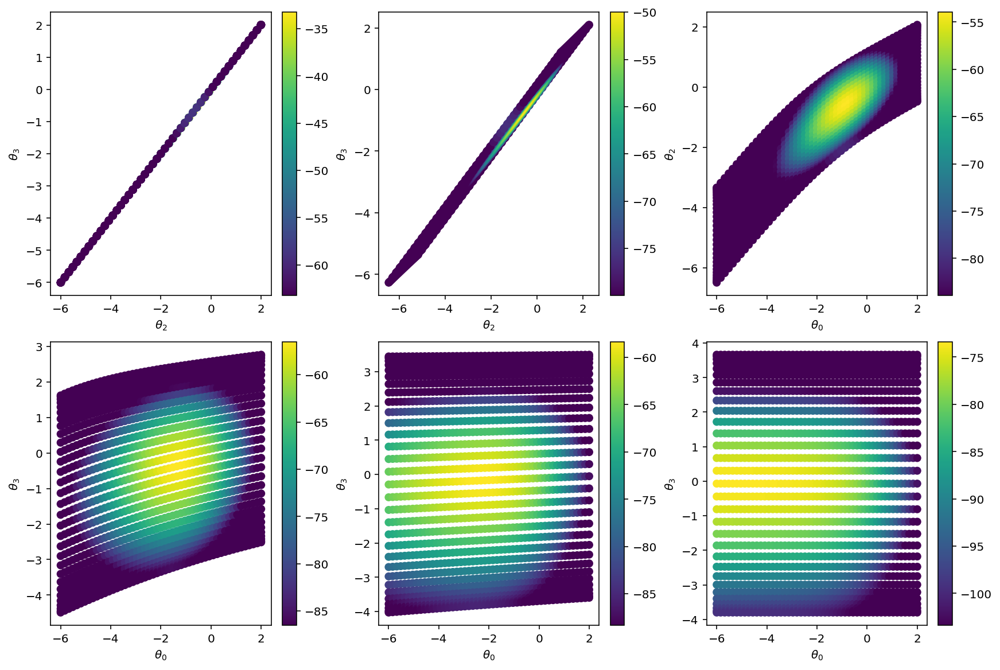

In [ ]:
explore_max_slice([0, 1], [0, 40, 45, 50, 55, 89])